# (23) Sim New -- visualize

**Motivation**: generate figs: flow patterns, PCA, distributions, etc. <br>

In [1]:
# HIDE CODE


import os, sys
from copy import deepcopy as dc
from os.path import join as pjoin
from IPython.display import display, IFrame, HTML

# tmp & extras dir
git_dir = pjoin(os.environ['HOME'], 'Dropbox/git')
extras_dir = pjoin(git_dir, 'jb-MTMST/_extras')
fig_base_dir = pjoin(git_dir, 'jb-MTMST/figs')
tmp_dir = pjoin(git_dir, 'jb-MTMST/tmp')

# GitHub
sys.path.insert(0, pjoin(git_dir, '_MTMST'))
from figures.fighelper import *
from model.opticflow import *

# warnings, tqdm, & style
warnings.filterwarnings('ignore', category=DeprecationWarning)
from tqdm.notebook import tqdm
from rich.jupyter import print
%matplotlib inline
set_style()

In [2]:
#

def _plot_singular_values(s, thres=90):
    fig, axes = create_figure(2, 1, (13, 7), sharex='all')
    axes[0].plot(s, marker='.')
    axes[1].plot(np.cumsum(s), lw=3, marker=None)

    idx = np.where(np.cumsum(s) > thres)[0][0]
    axes[1].axvline(
        idx, color='g', ls=':', lw=1.5,
        label=f'{idx} dimensions',
    )
    axes[1].axhline(
        thres, color='magenta', ls=':', lw=1.5,
        label=f'{thres}% of variance',
    )
    axes[1].legend()

    axes[1].axhline(0, color='k', ls='--', lw=1.2)
    axes[1].axhline(100, color='k', ls='--', lw=1.2)
    axes[1].set_ylim((-3, 103))
    add_grid(axes)
    plt.show()

## Prepare

In [3]:
fov = 45
dim = 19
res = 2*fov/(dim-1)
kws = dict(
    fov=fov,
    res=res,
    obj_r=0.2,
    obj_zlim=(0.5, 1.0),
    vlim_obj=(0.01, 1.0),
    vlim_slf=(0.01, 1.0),
)
print(kws)

{
    'fov': 45,
    'res': 5.0,
    'obj_r': 0.2,
    'obj_zlim': (0.5, 1.0),
    'vlim_obj': (0.01, 1.0),
    'vlim_slf': (0.01, 1.0)
}

## 1. Obj
**Meaning:** Object only, no self motion.

### num objects = 1

In [4]:
%%time

of = OpticFlow(
    category='obj',
    num=int(1.3e5),
    n_obj=1,
    **kws,
).compute_coords()
_ = of.compute_flow()

u, s, v = sp_lin.svd(
    a=flatten_arr(of.alpha_dot, ndim_end=0, ndim_start=1),
    full_matrices=False,
    compute_uv=True,
)
s *= 100 / s.sum()
titles = [f"{e:0.1f} %" for e in s]
pcs = v.reshape(-1, of.dim, of.dim, 2)

CPU times: user 2min 20s, sys: 7.02 s, total: 2min 27s
Wall time: 1min 30s


In [5]:
thres = 4
m = of.compute_obj_mask(of.objects[0].pos)
of.gamma = None
accepted = m.sum(1).sum(1) > thres
accepted.sum()

107511

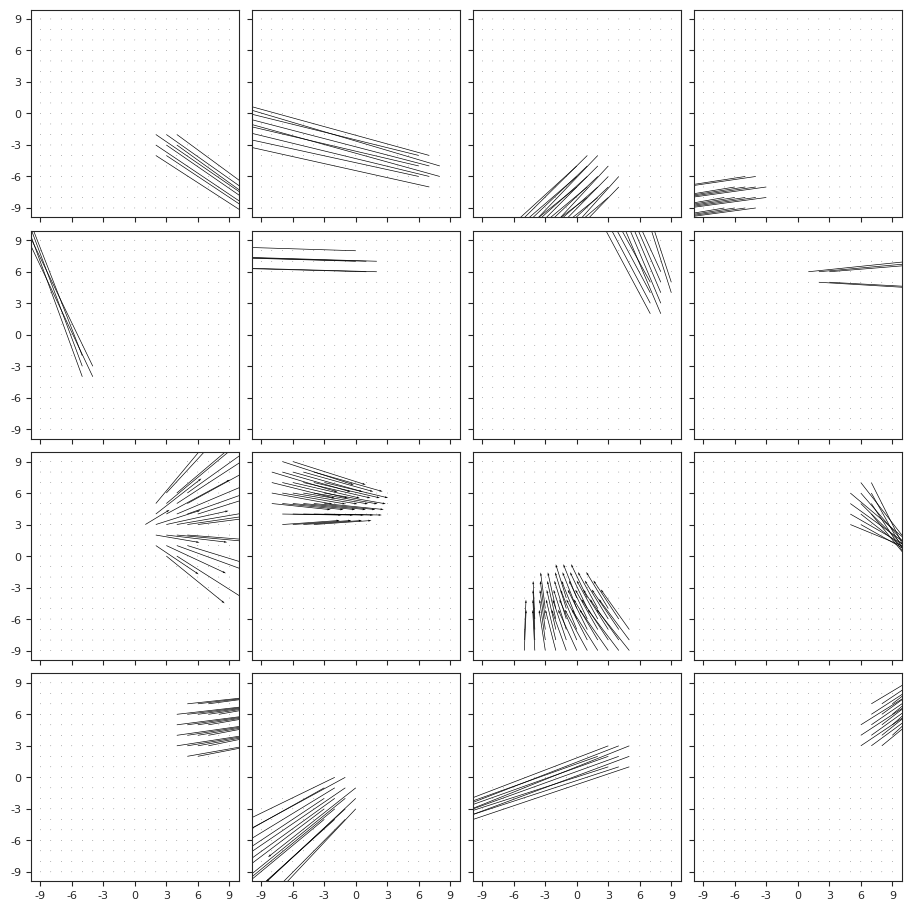

In [6]:
_ = show_opticflow(of.alpha_dot[accepted], scale=None)

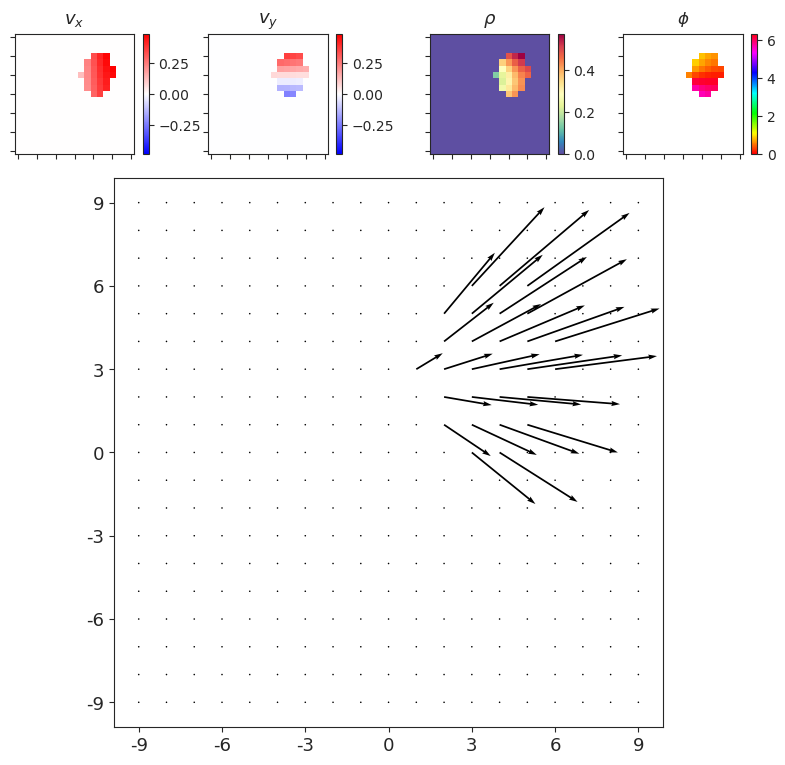

In [7]:
_ = show_opticflow_full(of.alpha_dot[accepted][8], scale=2.5)

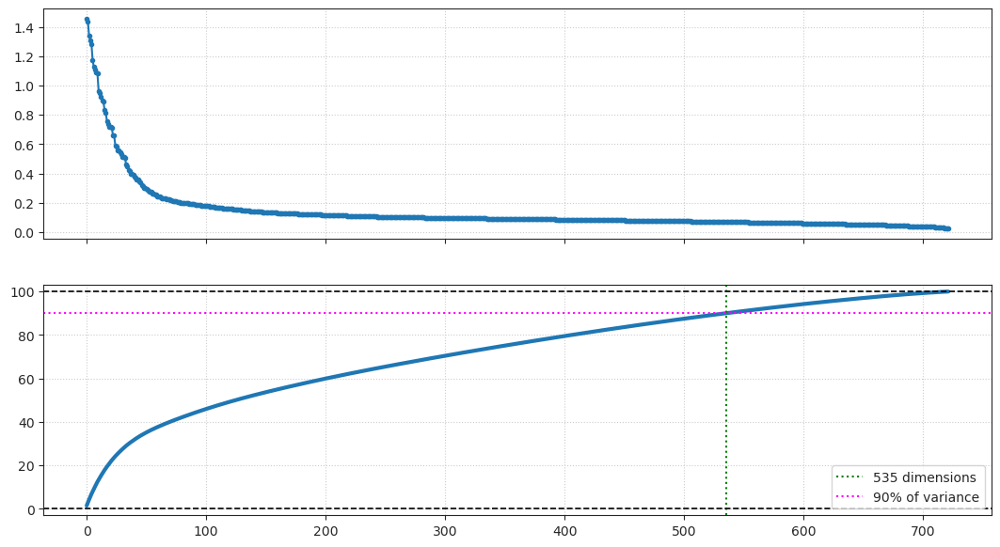

In [8]:
_plot_singular_values(s)

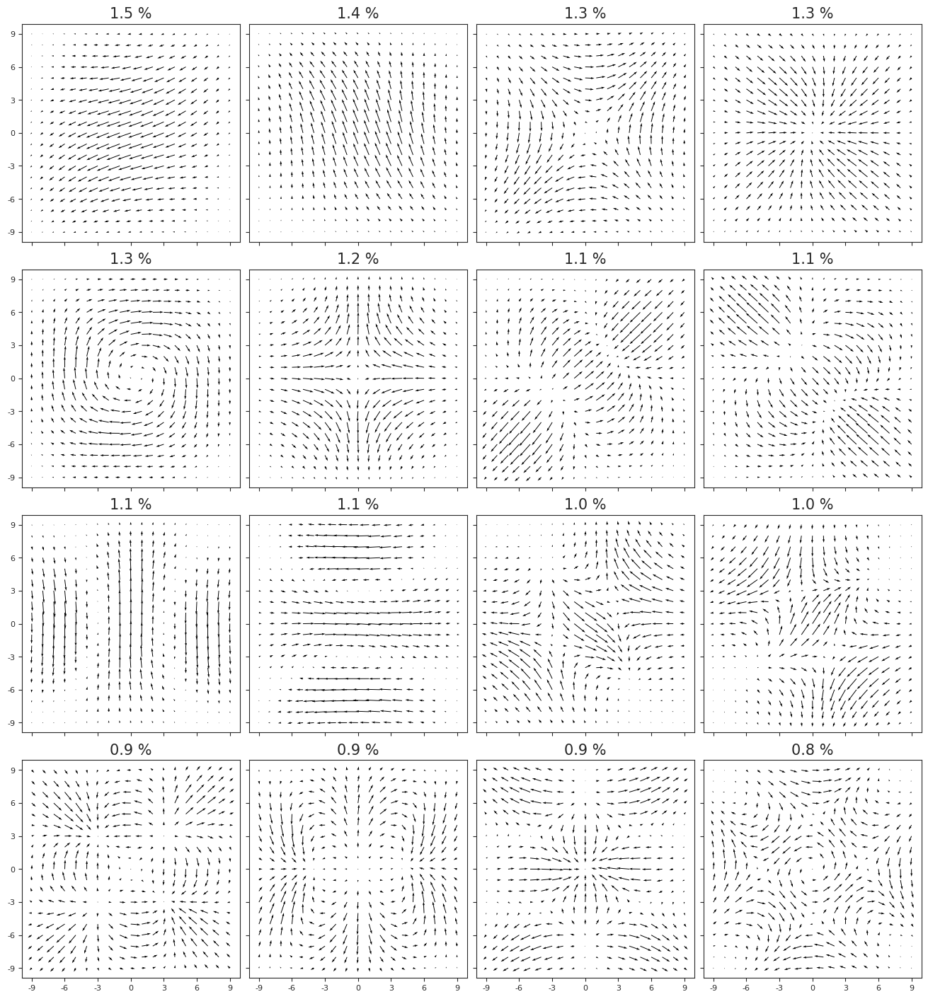

In [9]:
show_opticflow(pcs, num=4, titles=titles, scale=None, figsize=(13, 14));

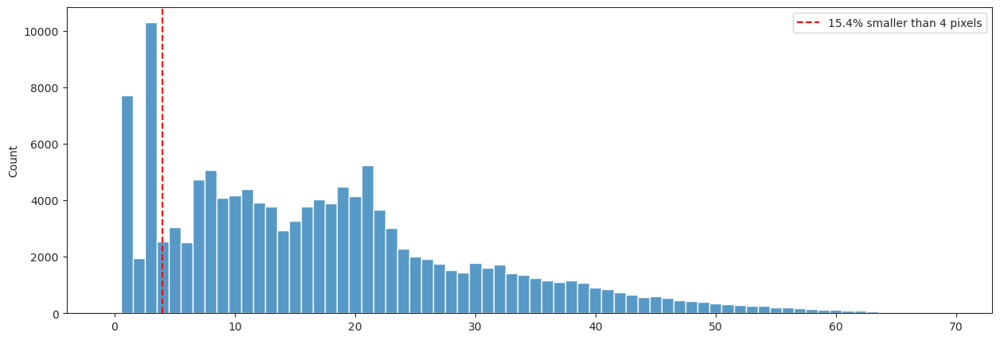

In [10]:
fig, ax = create_figure(1,1,(15, 5))
size_pix = m.sum(1).sum(1)
sns.histplot(size_pix, bins=np.linspace(0, 70, 71) - 0.5, ax=ax)

thres = 4
lbl = f'{100 * (size_pix < thres).sum() / of.num:0.1f}% smaller than {thres} pixels'
ax.axvline(thres, color='r', ls='--', label=lbl)
ax.legend();

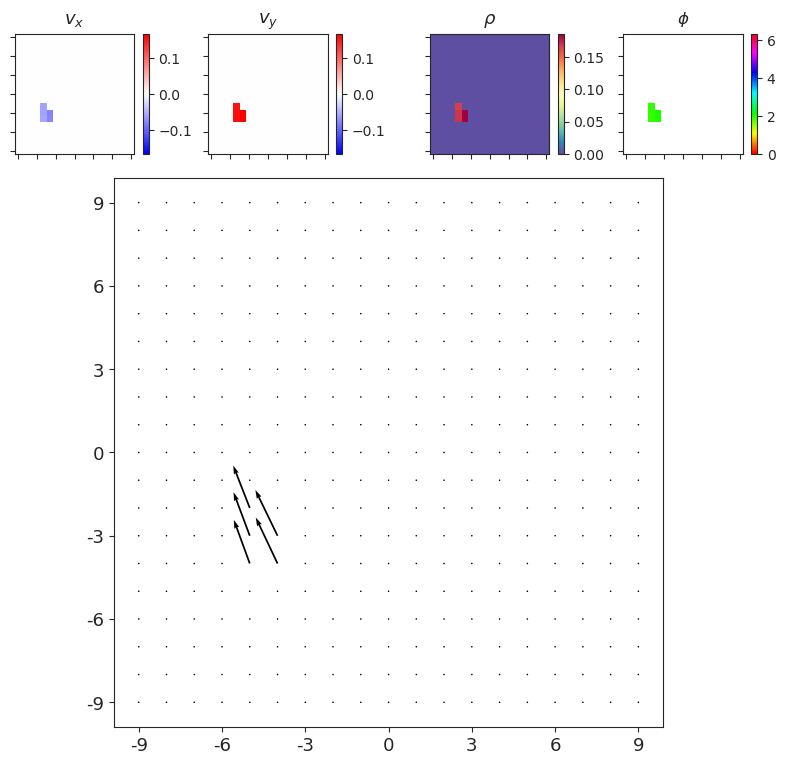

In [11]:
i = np.argmin(size_pix[accepted])
_ = show_opticflow_full(of.alpha_dot[accepted][i], scale=2)

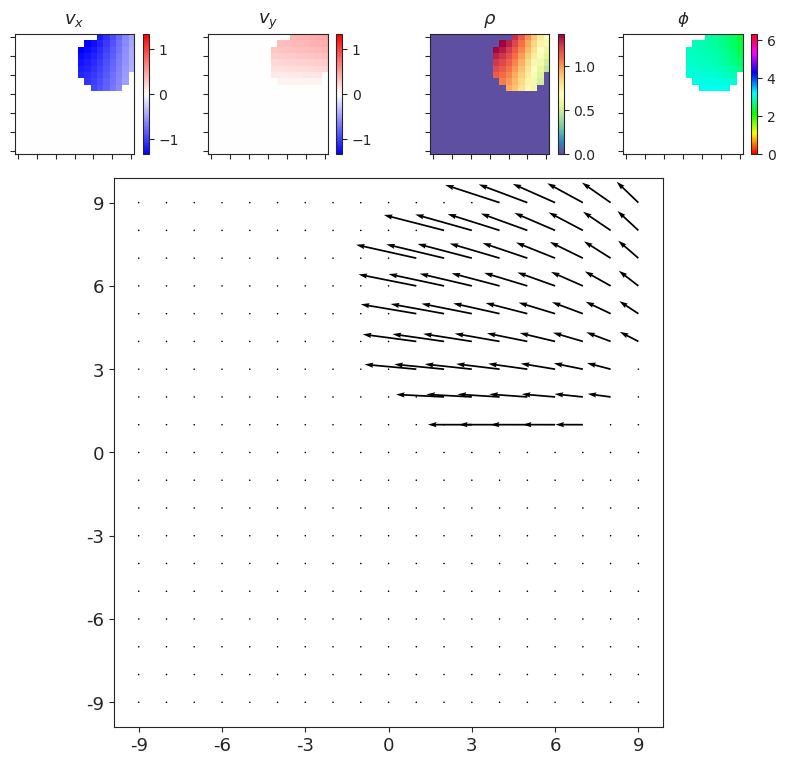

In [12]:
i = np.argmax(size_pix[accepted])
_ = show_opticflow_full(of.alpha_dot[accepted][i], scale=12)

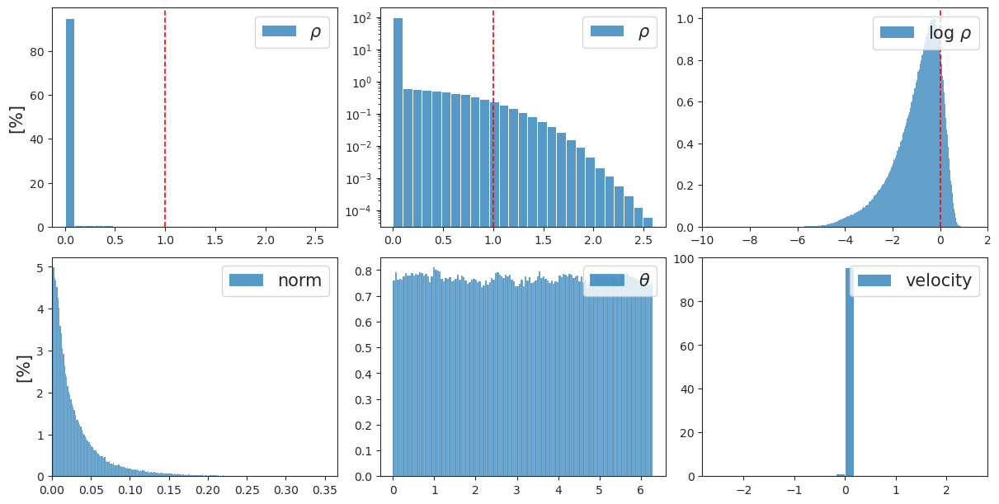

CPU times: user 1min 15s, sys: 7.34 s, total: 1min 23s
Wall time: 1min 23s


In [13]:
%%time

_ = plot_opticflow_hist(of.alpha_dot[accepted])

### num objects = 4

In [14]:
%%time

of = OpticFlow(
    category='obj',
    num=int(1.3e5),
    n_obj=4,
    **kws,
).compute_coords()
_ = of.compute_flow()

u, s, v = sp_lin.svd(
    a=flatten_arr(of.alpha_dot, ndim_end=0, ndim_start=1),
    full_matrices=False,
    compute_uv=True,
)
s *= 100 / s.sum()
titles = [f"{e:0.1f} %" for e in s]
pcs = v.reshape(-1, of.dim, of.dim, 2)

CPU times: user 3min 21s, sys: 9.07 s, total: 3min 30s
Wall time: 2min 36s


In [15]:
thres = 4
m = of.compute_obj_mask(of.objects[0].pos)
of.gamma = None
accepted = m.sum(1).sum(1) > thres
accepted.sum()

107511

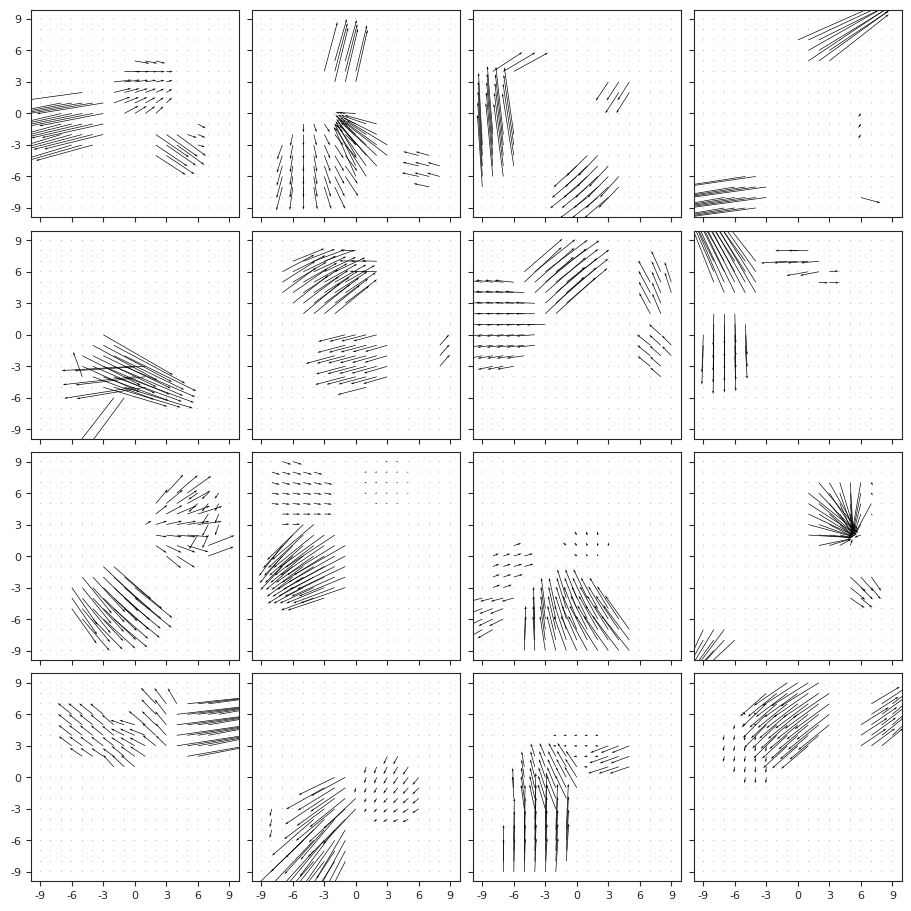

In [16]:
_ = show_opticflow(of.alpha_dot[accepted], scale=None)

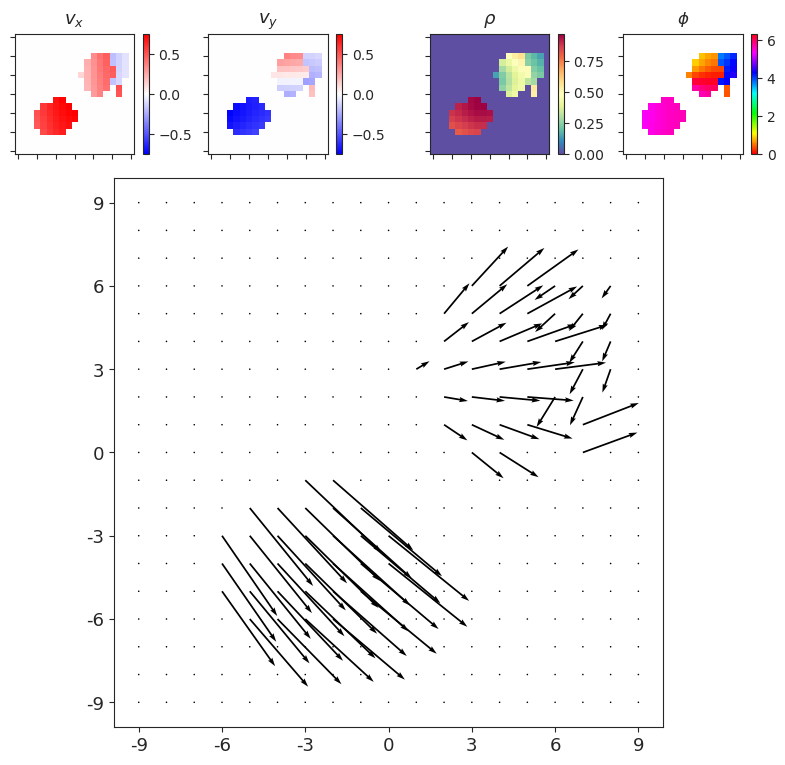

In [17]:
_ = show_opticflow_full(of.alpha_dot[accepted][8], scale=5)

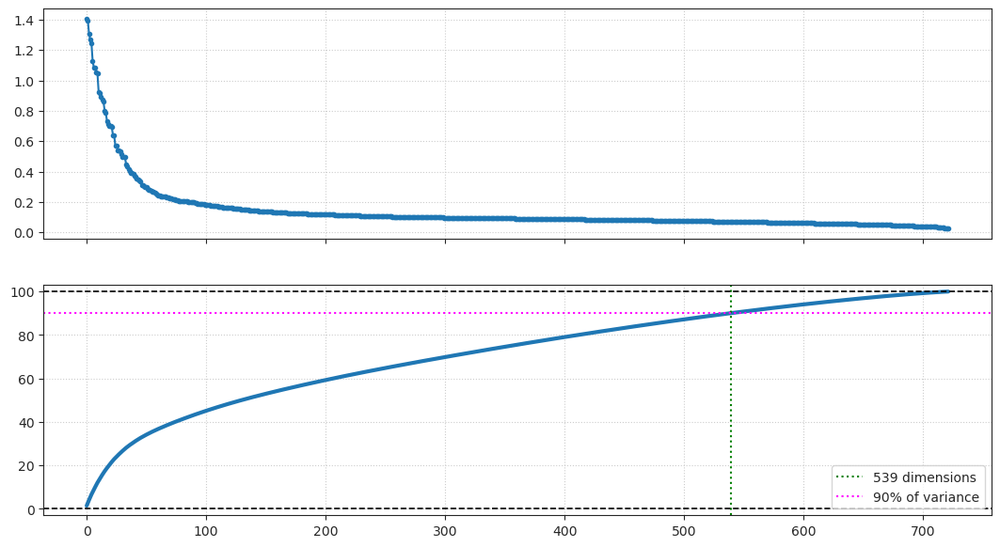

In [18]:
_plot_singular_values(s)

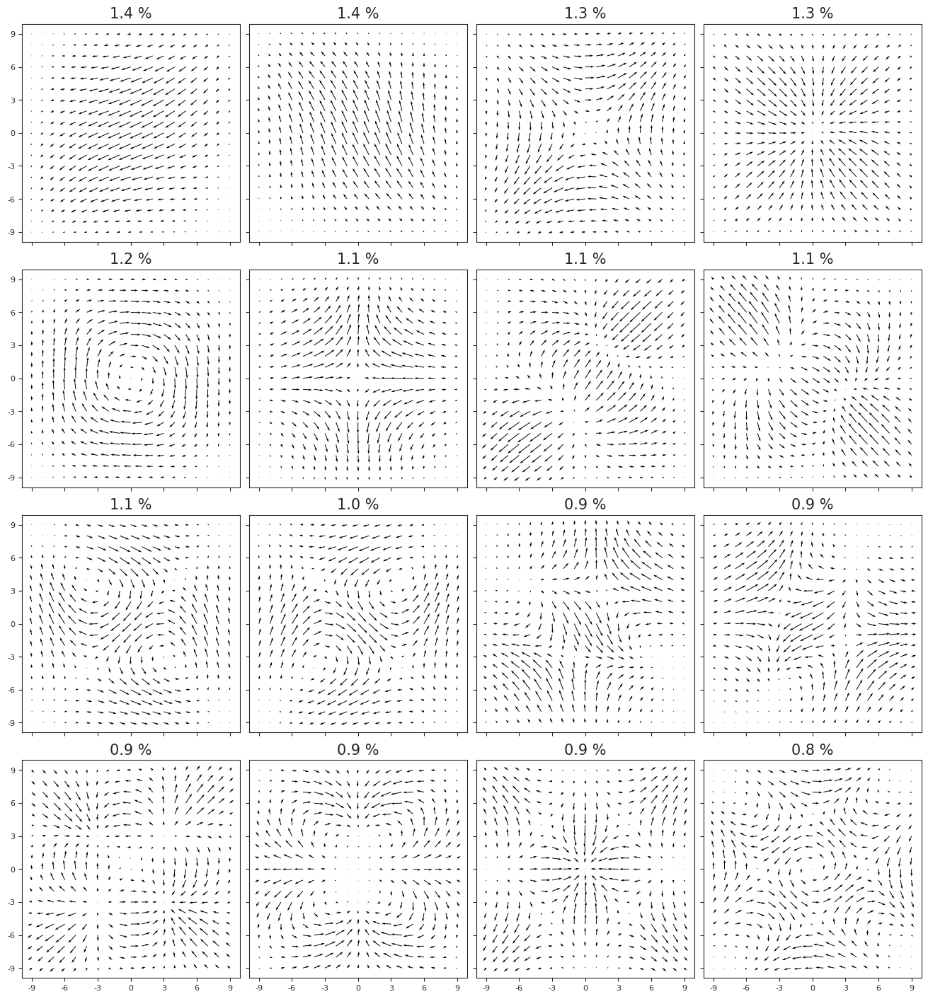

In [19]:
show_opticflow(pcs, num=4, titles=titles, scale=None, figsize=(13, 14));

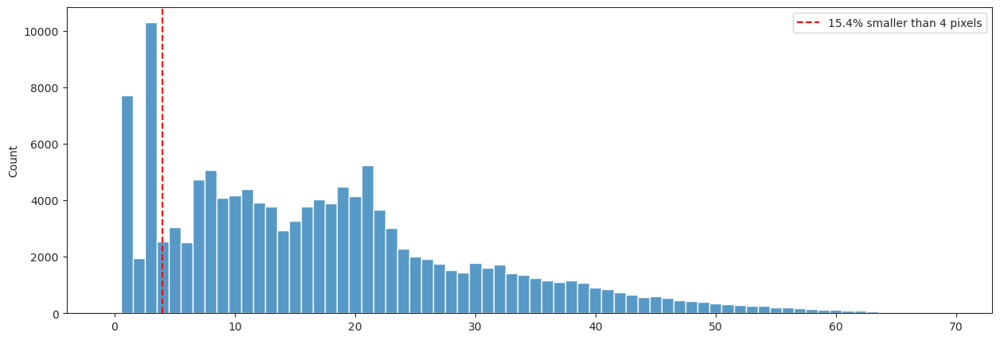

In [20]:
fig, ax = create_figure(1,1,(15, 5))
size_pix = m.sum(1).sum(1)
sns.histplot(size_pix, bins=np.linspace(0, 70, 71) - 0.5, ax=ax)

thres = 4
lbl = f'{100 * (size_pix < thres).sum() / of.num:0.1f}% smaller than {thres} pixels'
ax.axvline(thres, color='r', ls='--', label=lbl)
ax.legend();

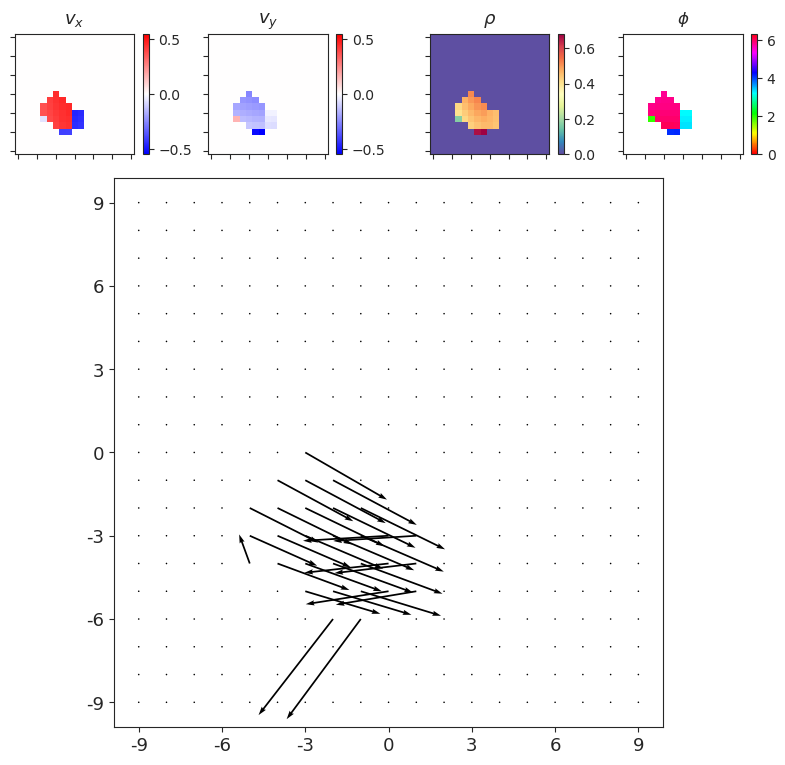

In [21]:
i = np.argmin(size_pix[accepted])
_ = show_opticflow_full(of.alpha_dot[accepted][i], scale=3)

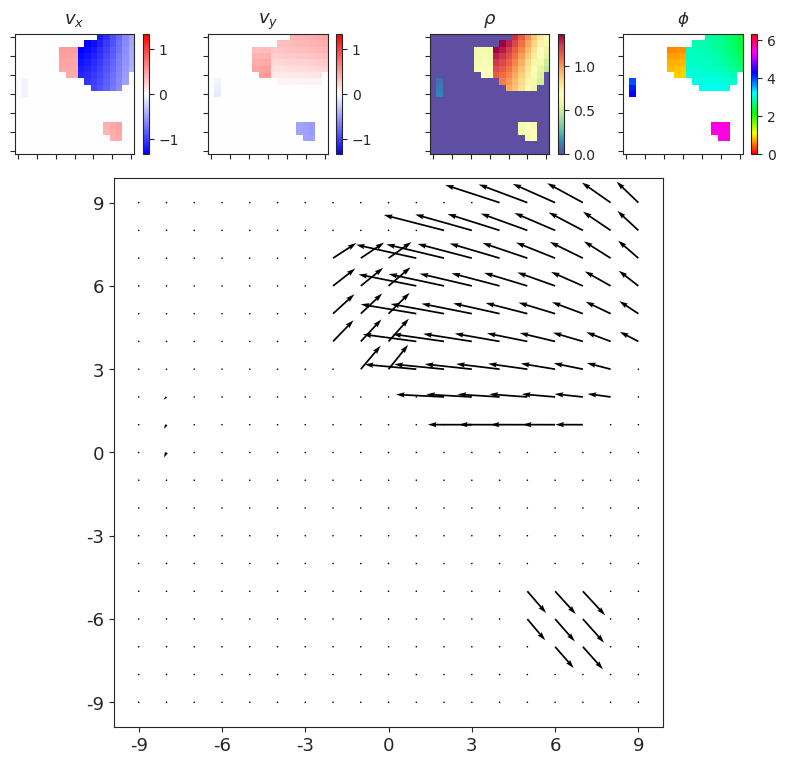

In [22]:
i = np.argmax(size_pix[accepted])
_ = show_opticflow_full(of.alpha_dot[accepted][i], scale=12)

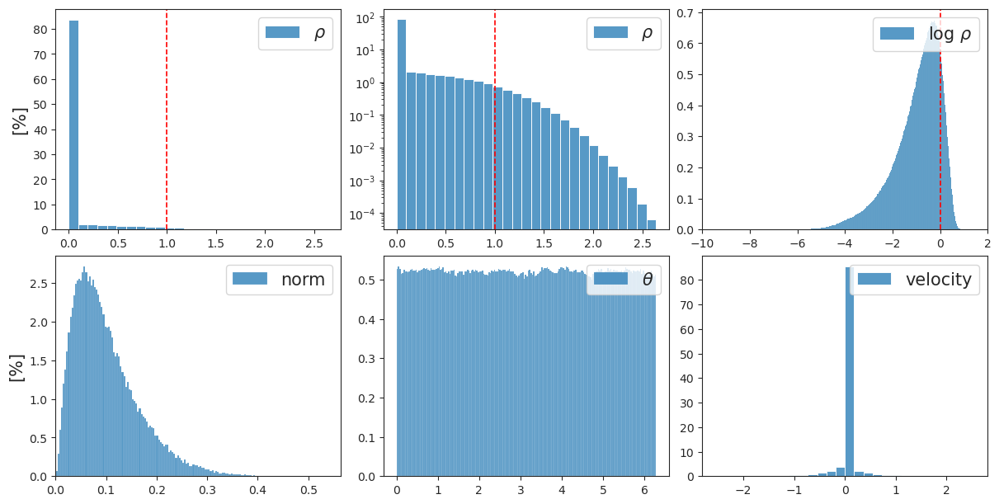

CPU times: user 1min 19s, sys: 7.28 s, total: 1min 26s
Wall time: 1min 26s


In [23]:
%%time

_ = plot_opticflow_hist(of.alpha_dot[accepted])

## 2. Translation
**Meaning:** Self-motion, translation only (no eye movement = no rotation).

In [24]:
%%time

of = OpticFlow(
    category='transl',
    num=int(1.3e5),
    n_obj=1,
    **kws,
).compute_coords()
_ = of.compute_flow()

u, s, v = sp_lin.svd(
    a=flatten_arr(of.alpha_dot, ndim_end=0, ndim_start=1),
    full_matrices=False,
    compute_uv=True,
)
s *= 100 / s.sum()
titles = [f"{e:0.1f} %" for e in s]
pcs = v.reshape(-1, of.dim, of.dim, 2)

CPU times: user 2min 21s, sys: 22.9 s, total: 2min 44s
Wall time: 1min 46s


In [25]:
thres = 4
m = of.compute_obj_mask(of.objects[0].pos)
of.gamma = None
accepted = m.sum(1).sum(1) > thres
accepted.sum()

107526

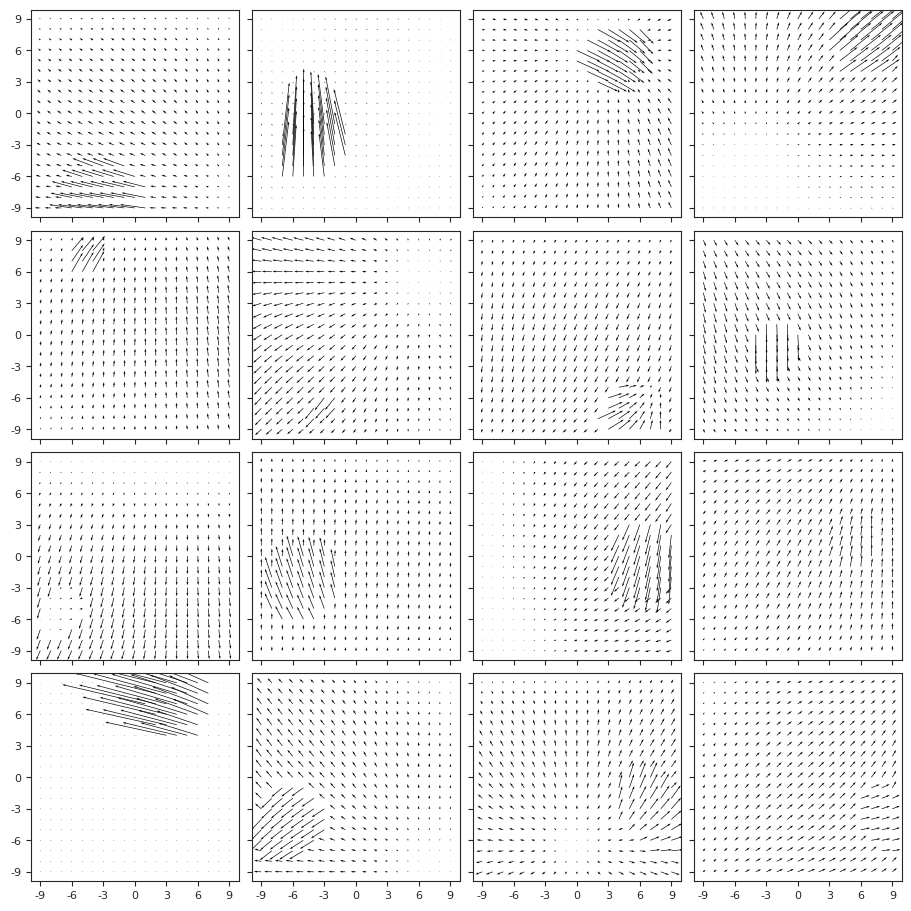

In [26]:
_ = show_opticflow(of.alpha_dot[accepted][250:], scale=None)

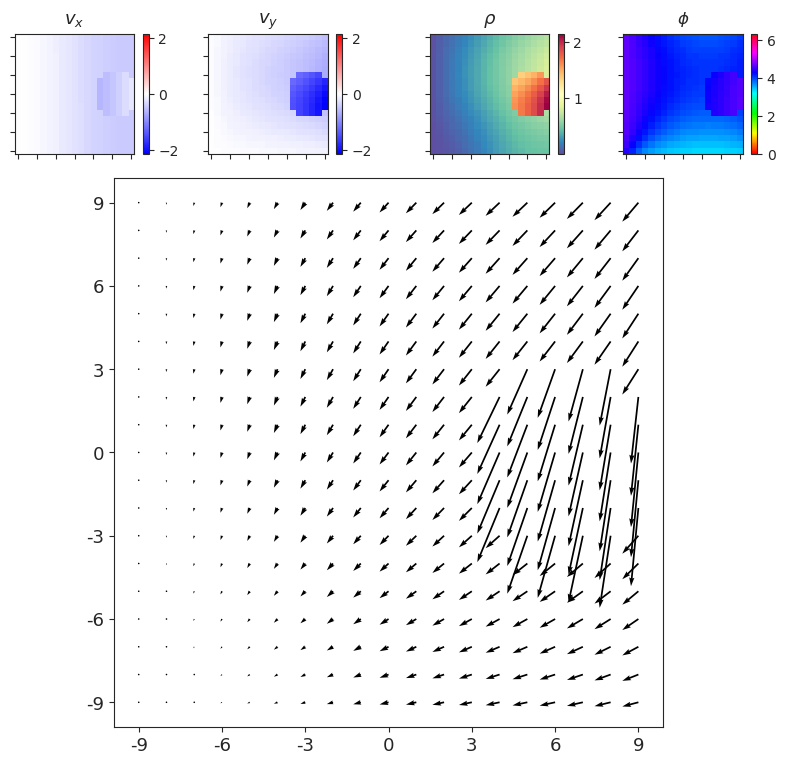

In [27]:
_ = show_opticflow_full(of.alpha_dot[accepted][260], scale=15)

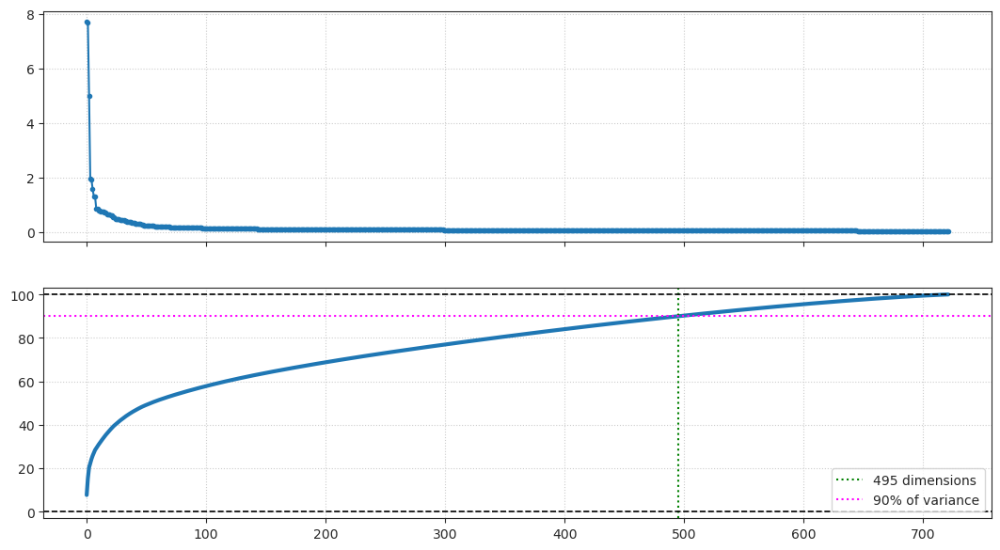

In [28]:
_plot_singular_values(s)

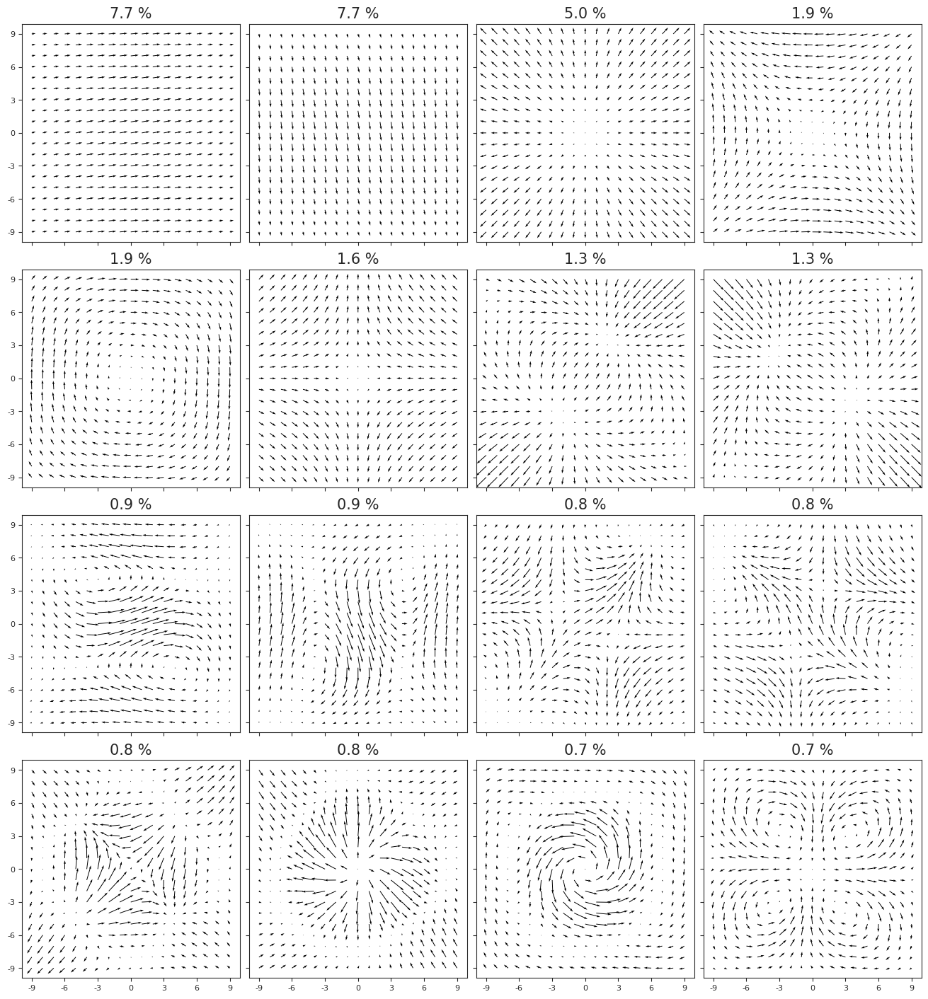

In [29]:
show_opticflow(pcs, num=4, titles=titles, scale=None, figsize=(13, 14));

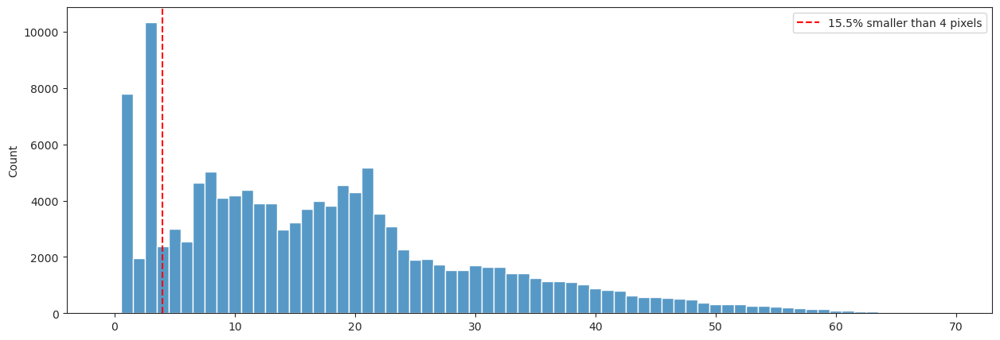

In [30]:
fig, ax = create_figure(1,1,(15, 5))
size_pix = m.sum(1).sum(1)
sns.histplot(size_pix, bins=np.linspace(0, 70, 71) - 0.5, ax=ax)

thres = 4
lbl = f'{100 * (size_pix < thres).sum() / of.num:0.1f}% smaller than {thres} pixels'
ax.axvline(thres, color='r', ls='--', label=lbl)
ax.legend();

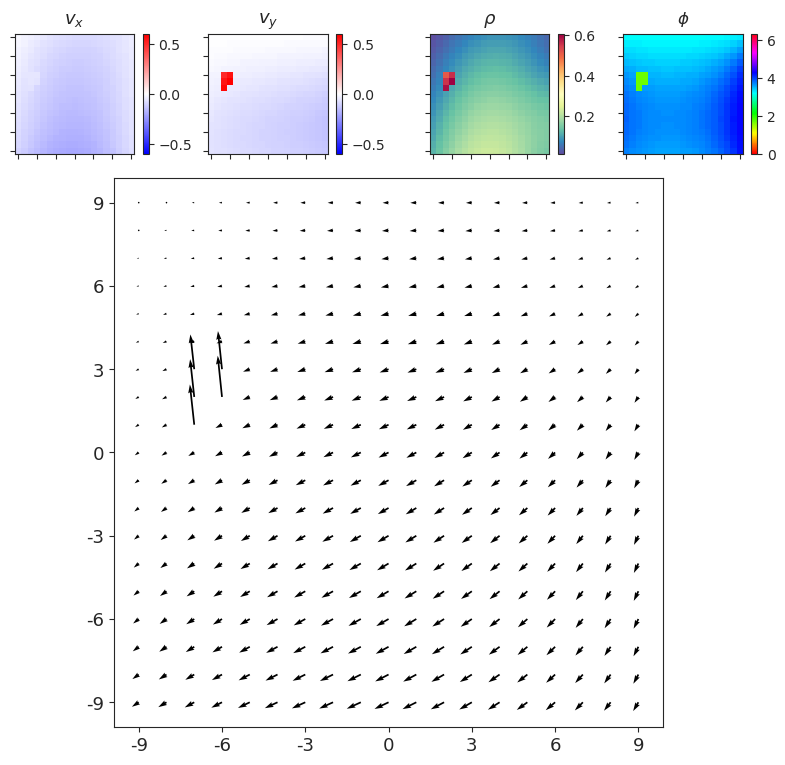

In [31]:
i = np.argmin(size_pix[accepted])
_ = show_opticflow_full(of.alpha_dot[accepted][i], scale=8)

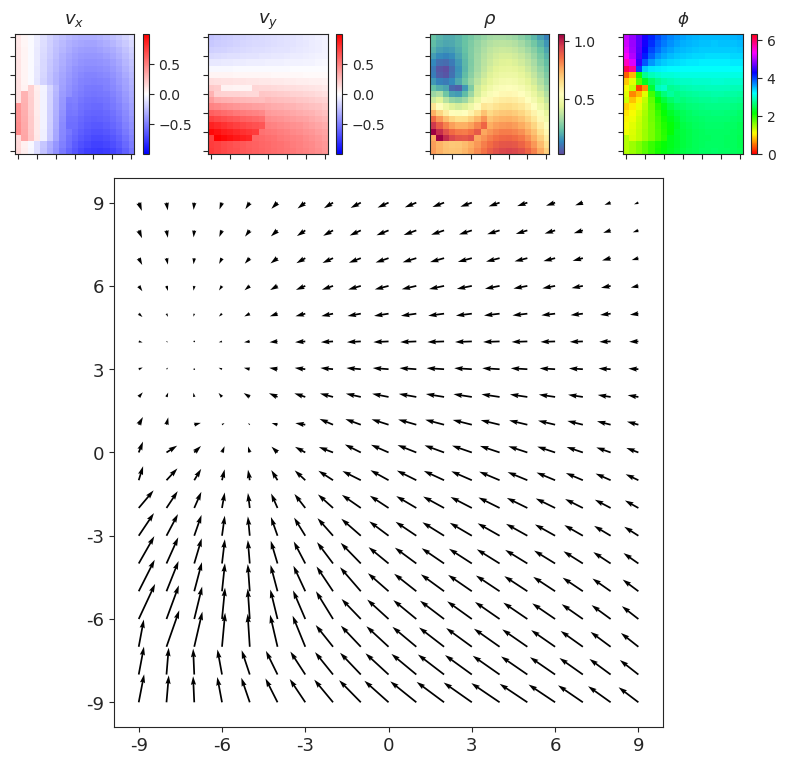

In [32]:
i = np.argmax(size_pix[accepted])
_ = show_opticflow_full(of.alpha_dot[accepted][i], scale=15)

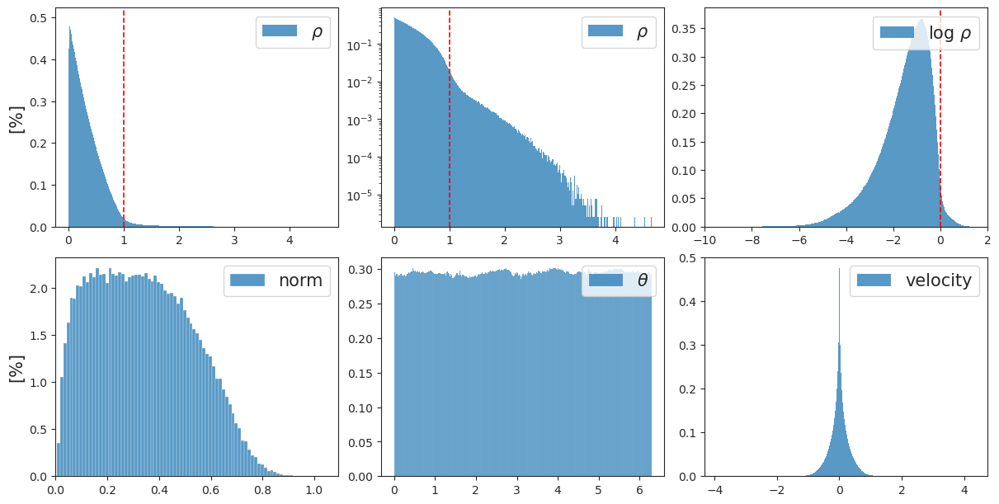

CPU times: user 1min 49s, sys: 9.4 s, total: 1min 59s
Wall time: 1min 59s


In [33]:
%%time

_ = plot_opticflow_hist(of.alpha_dot[accepted])

## 3. fixate
**Meaning:** Self-motion while maintaining fixation on a point on the wall. This means eyes rotate.

### num objects = 1

In [34]:
%%time

of = OpticFlow(
    category='fixate',
    num=int(1.3e5),
    n_obj=1,
    **kws,
).compute_coords()
_ = of.compute_flow()

u, s, v = sp_lin.svd(
    a=flatten_arr(of.alpha_dot, ndim_end=0, ndim_start=1),
    full_matrices=False,
    compute_uv=True,
)
s *= 100 / s.sum()
titles = [f"{e:0.1f} %" for e in s]
pcs = v.reshape(-1, of.dim, of.dim, 2)

CPU times: user 2min 25s, sys: 22.9 s, total: 2min 48s
Wall time: 1min 54s


In [35]:
thres = 4
m = of.compute_obj_mask(of.objects[0].pos)
of.gamma = None
accepted = m.sum(1).sum(1) > thres
accepted.sum()

107526

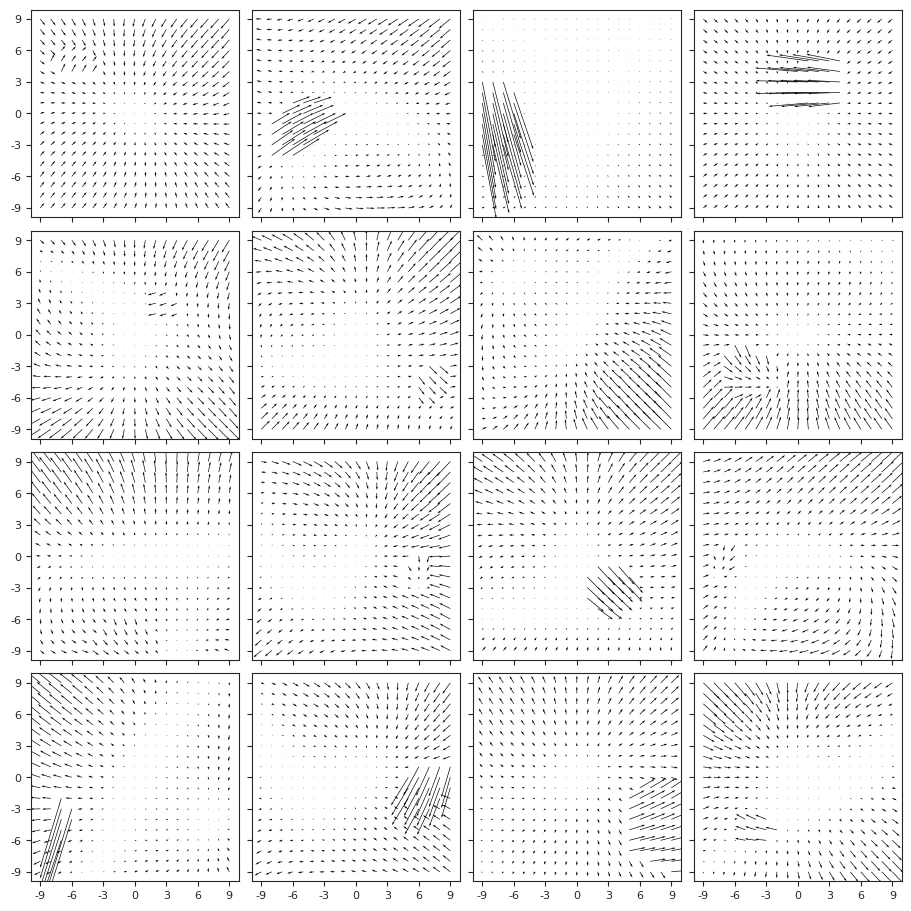

In [36]:
_ = show_opticflow(of.alpha_dot[accepted], scale=None)

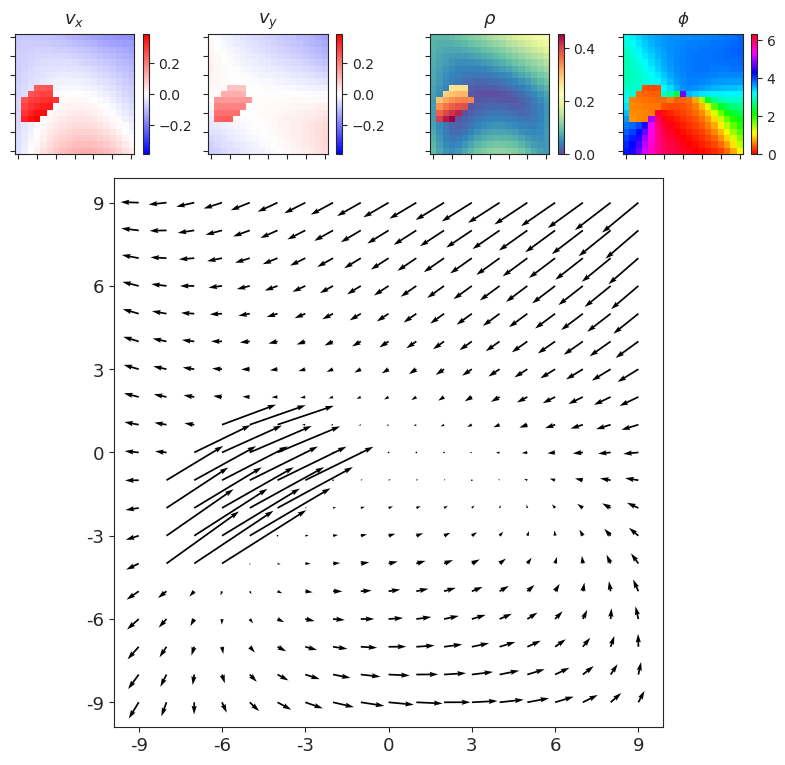

In [37]:
_ = show_opticflow_full(of.alpha_dot[accepted][1], scale=2.5)

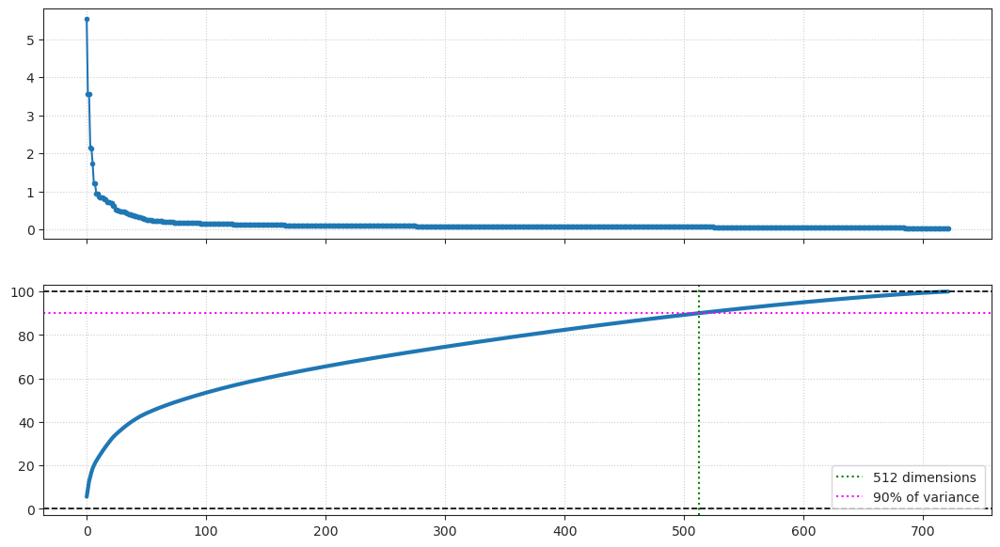

In [38]:
_plot_singular_values(s)

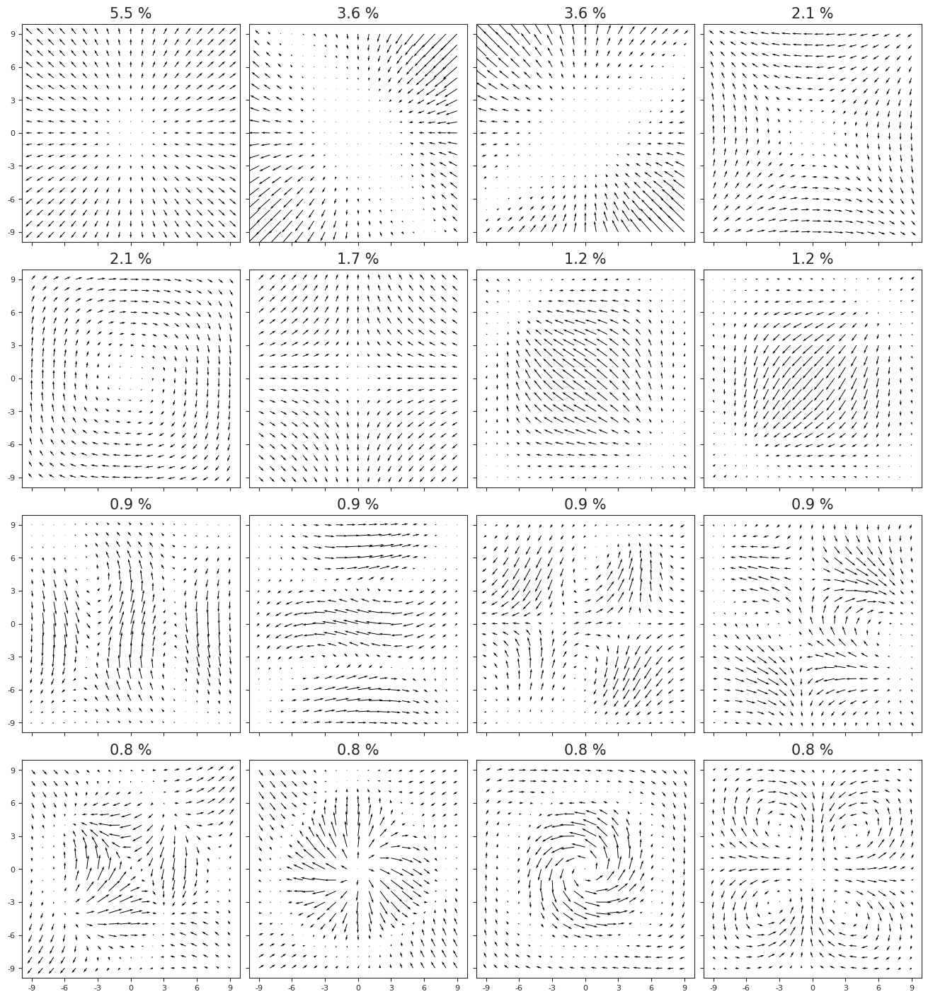

In [39]:
show_opticflow(pcs, num=4, titles=titles, scale=None, figsize=(13, 14));

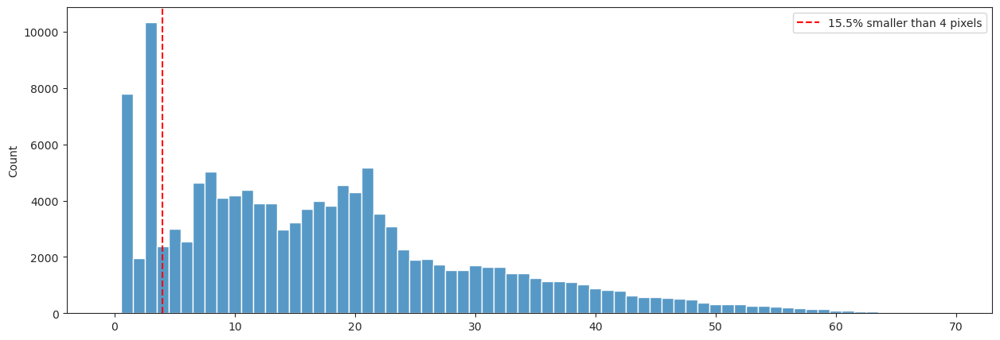

In [40]:
fig, ax = create_figure(1,1,(15, 5))
size_pix = m.sum(1).sum(1)
sns.histplot(size_pix, bins=np.linspace(0, 70, 71) - 0.5, ax=ax)

thres = 4
lbl = f'{100 * (size_pix < thres).sum() / of.num:0.1f}% smaller than {thres} pixels'
ax.axvline(thres, color='r', ls='--', label=lbl)
ax.legend();

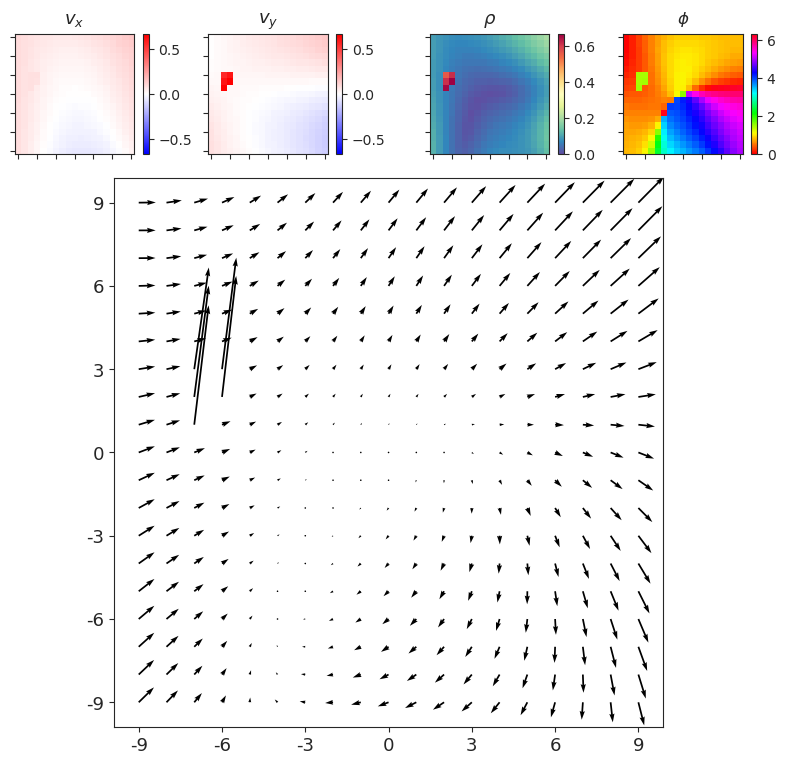

In [41]:
i = np.argmin(size_pix[accepted])
_ = show_opticflow_full(of.alpha_dot[accepted][i], scale=3)

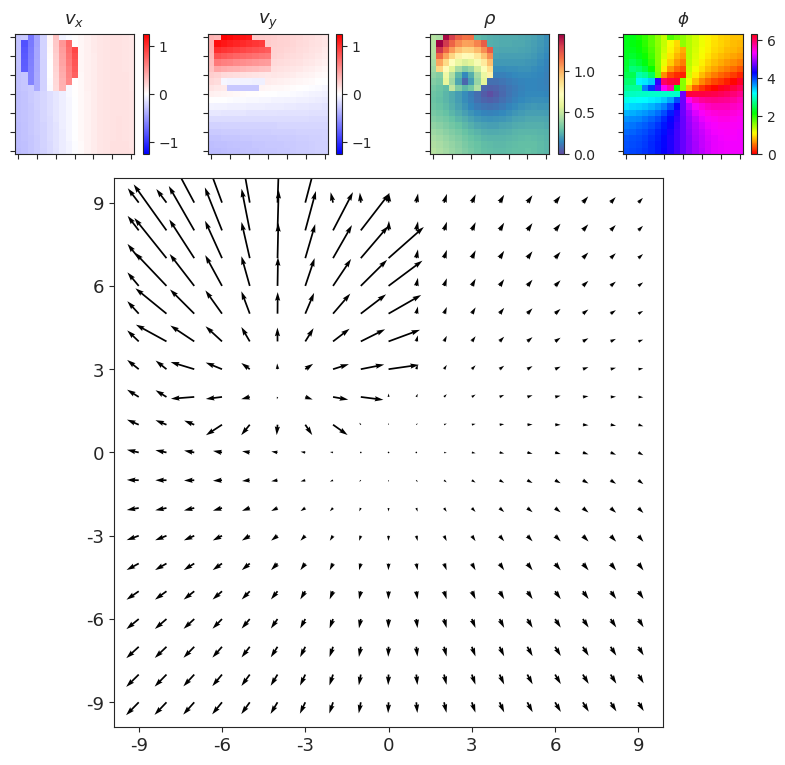

In [42]:
i = np.argsort(size_pix[accepted])[-3]
_ = show_opticflow_full(of.alpha_dot[accepted][i], scale=14)

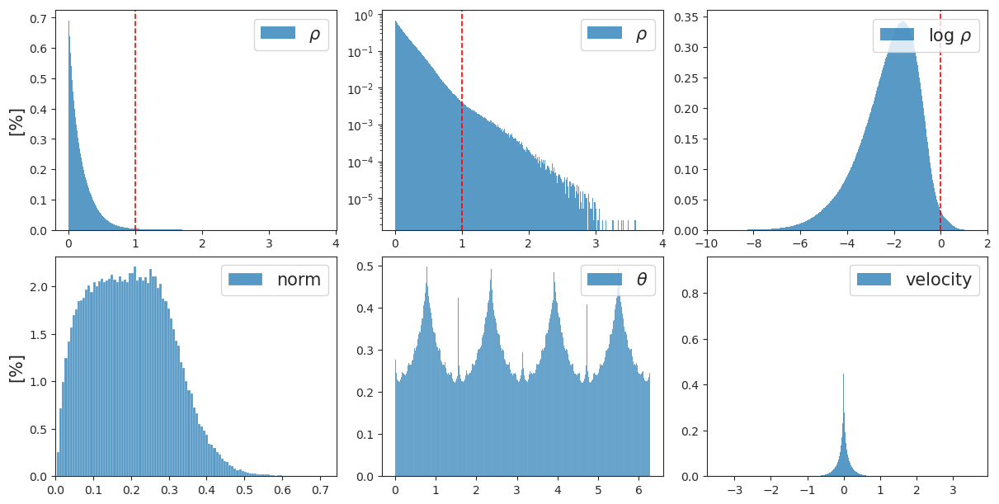

CPU times: user 2min 2s, sys: 9.36 s, total: 2min 12s
Wall time: 2min 12s


In [43]:
%%time

_ = plot_opticflow_hist(of.alpha_dot[accepted])

### num objects = 4

In [60]:
%%time

of = OpticFlow(
    category='fixate',
    num=int(2e5),
    n_obj=4,
    **kws,
).compute_coords()
_ = of.compute_flow()
of.gamma = None

accepted = {
    i: obj.size * of.dim ** 2 > thres
    for i, obj in of.objects.items()
}
accepted = functools.reduce(np.logical_and, accepted.values())

u, s, v = sp_lin.svd(
    a=flatten_arr(of.alpha_dot[accepted], ndim_end=0, ndim_start=1),
    full_matrices=False,
    compute_uv=True,
)
s *= 100 / s.sum()
titles = [f"{e:0.1f} %" for e in s]
pcs = v.reshape(-1, of.dim, of.dim, 2)

CPU times: user 4min 40s, sys: 57.1 s, total: 5min 38s
Wall time: 4min 47s


In [61]:
accepted.sum()

102014

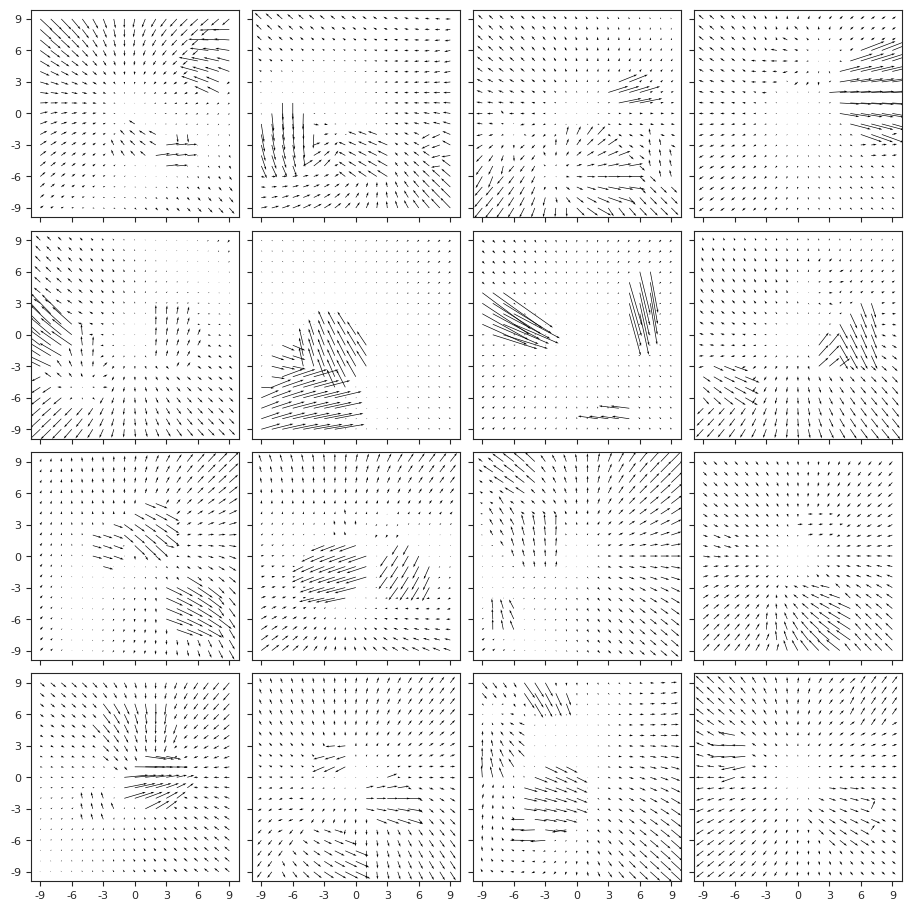

In [62]:
_ = show_opticflow(of.alpha_dot[accepted], scale=None)

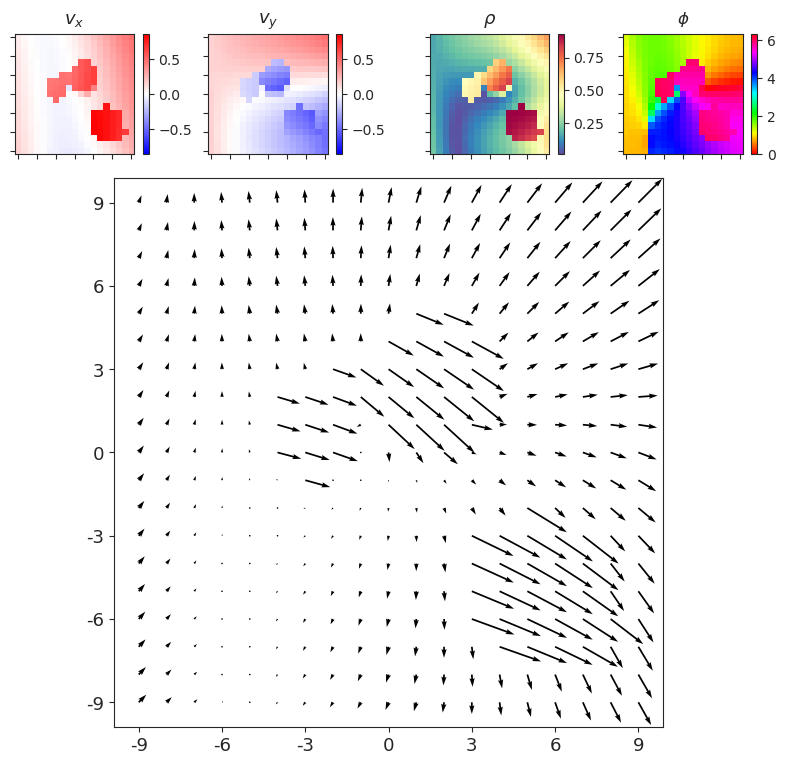

In [67]:
_ = show_opticflow_full(of.alpha_dot[accepted][8], scale=11)

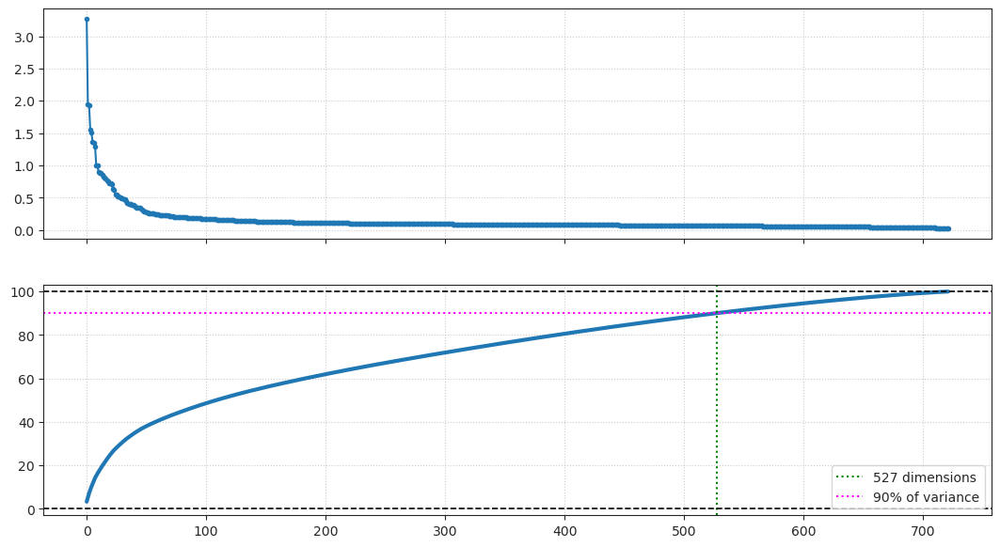

In [68]:
_plot_singular_values(s)

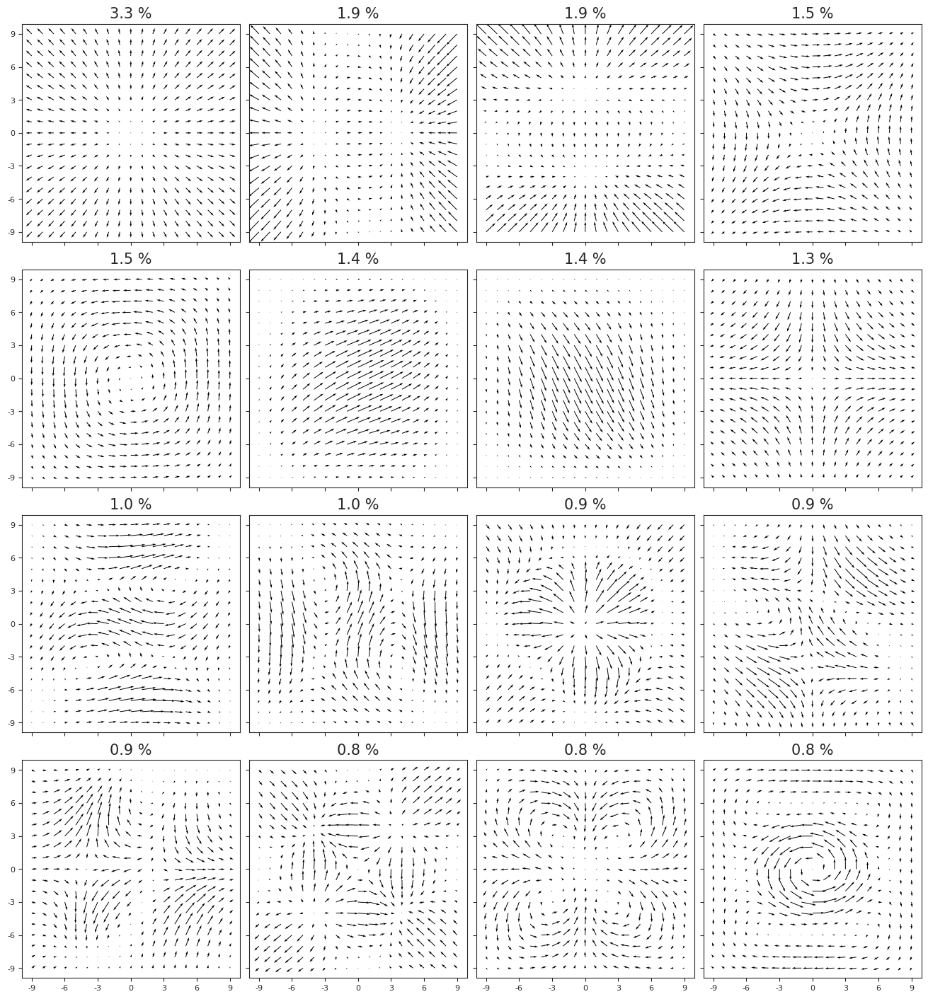

In [69]:
show_opticflow(pcs, num=4, titles=titles, scale=None, figsize=(13, 14));

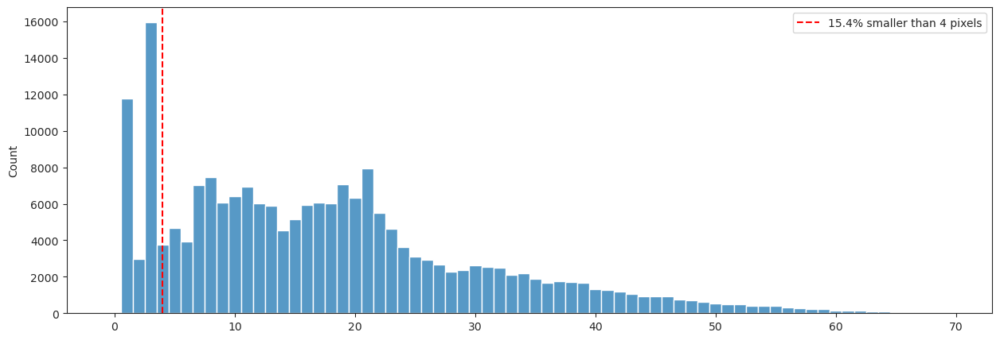

In [72]:
fig, ax = create_figure(1,1,(15, 5))
size_pix = of.objects[0].size * of.dim ** 2
sns.histplot(size_pix, bins=np.linspace(0, 70, 71) - 0.5, ax=ax)

thres = 4
lbl = f'{100 * (size_pix < thres).sum() / of.num:0.1f}% smaller than {thres} pixels'
ax.axvline(thres, color='r', ls='--', label=lbl)
ax.legend();

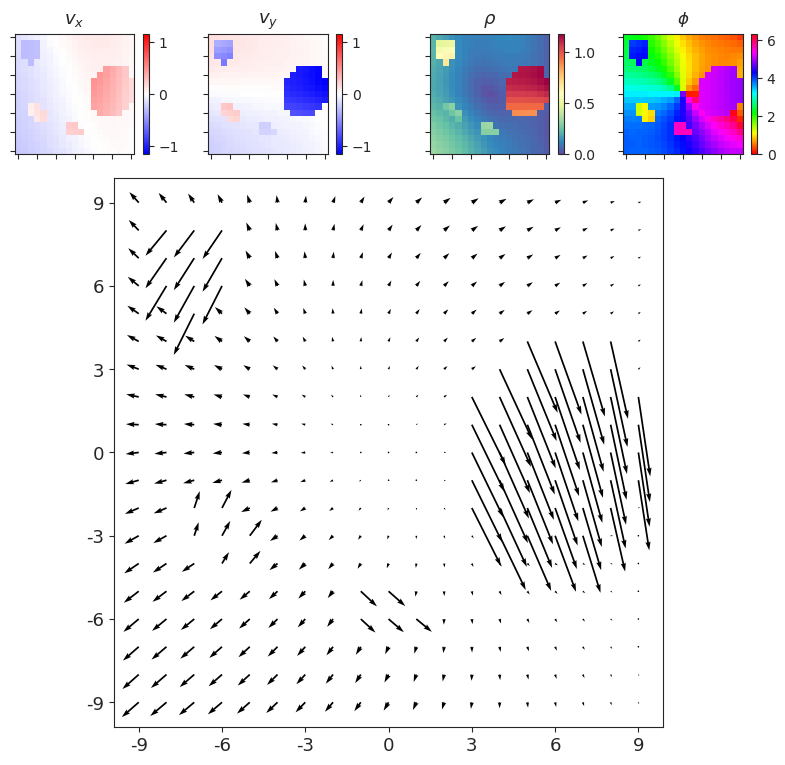

In [80]:
i = np.argmin(size_pix[accepted])
_ = show_opticflow_full(of.alpha_dot[accepted][i], scale=8)

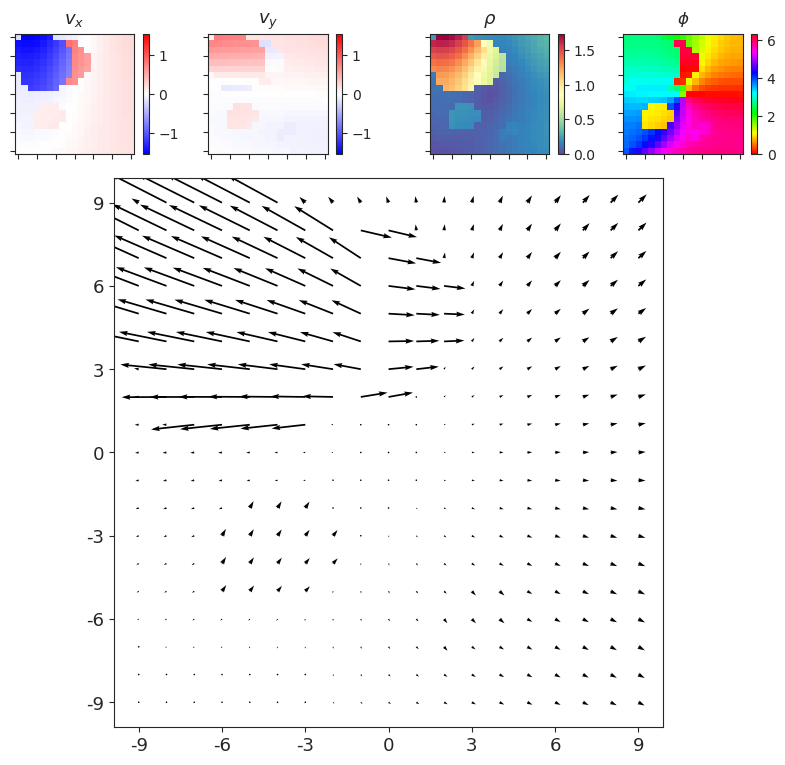

In [84]:
i = np.argmax(size_pix[accepted])
_ = show_opticflow_full(of.alpha_dot[accepted][i], scale=15)

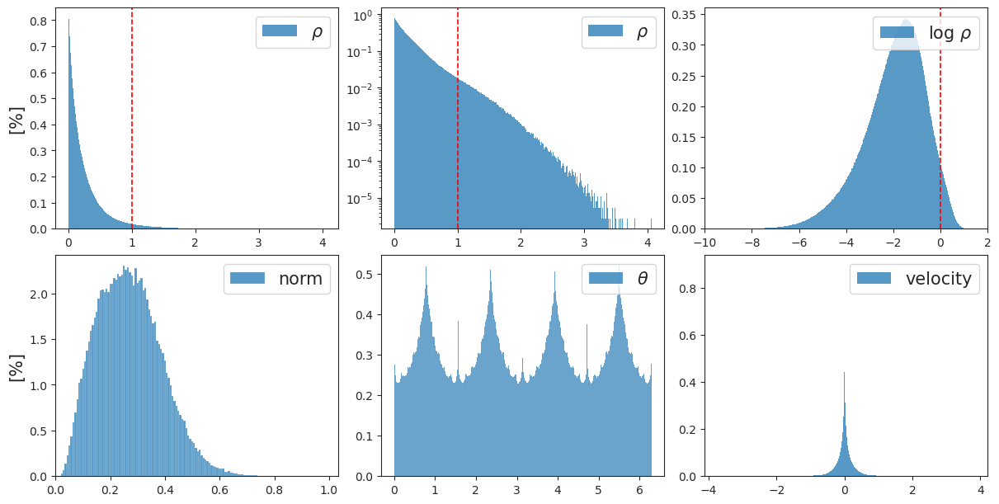

CPU times: user 1min 54s, sys: 8.68 s, total: 2min 2s
Wall time: 2min 2s


In [85]:
%%time

_ = plot_opticflow_hist(of.alpha_dot[accepted])

### num objects = 16

In [180]:
%%time

of = OpticFlow(
    category='fixate',
    num=int(5e5),
    n_obj=16,
    **kws,
).compute_coords()
_ = of.compute_flow()
of.gamma = None

accepted = {
    i: obj.size * of.dim ** 2 > thres
    for i, obj in of.objects.items()
}
accepted = functools.reduce(
    np.logical_and,
    accepted.values(),
)

u, s, v = sp_lin.svd(
    a=flatten_arr(of.alpha_dot[accepted], ndim_end=0, ndim_start=1),
    full_matrices=False,
    compute_uv=True,
)
s *= 100 / s.sum()
titles = [f"{e:0.1f} %" for e in s]
pcs = v.reshape(-1, of.dim, of.dim, 2)

CPU times: user 26min 39s, sys: 3min 25s, total: 30min 4s
Wall time: 29min 29s


In [181]:
accepted.sum()

88082

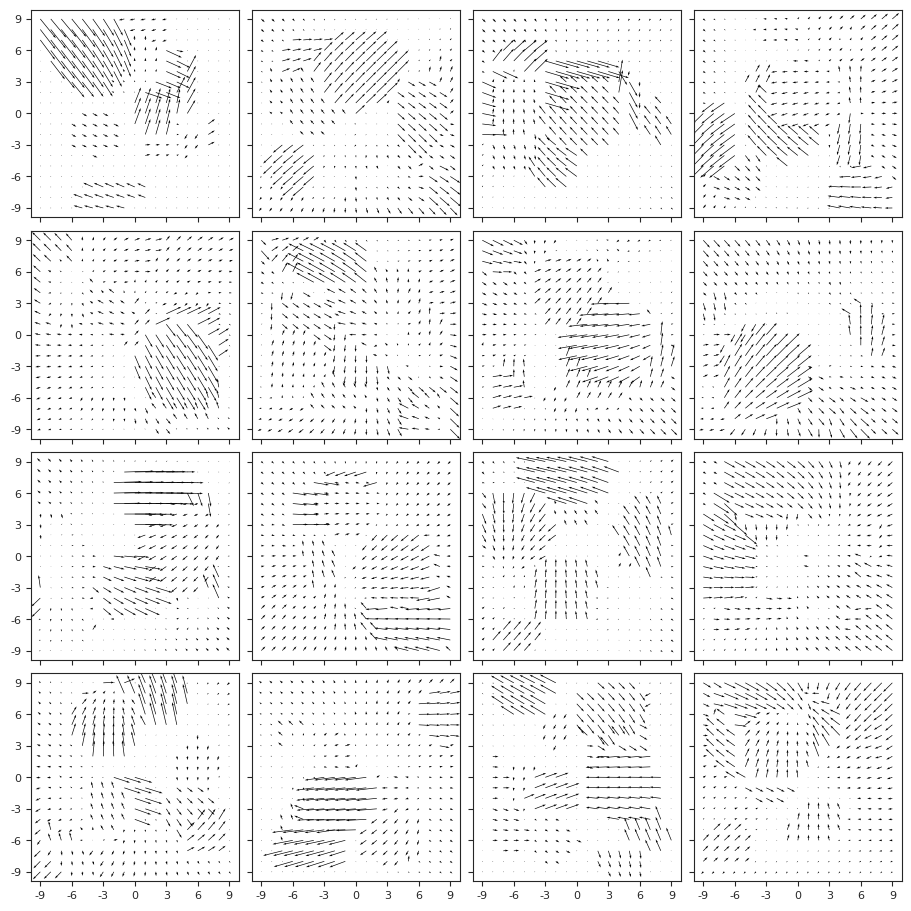

In [190]:
_ = show_opticflow(of.alpha_dot[accepted], scale=None)

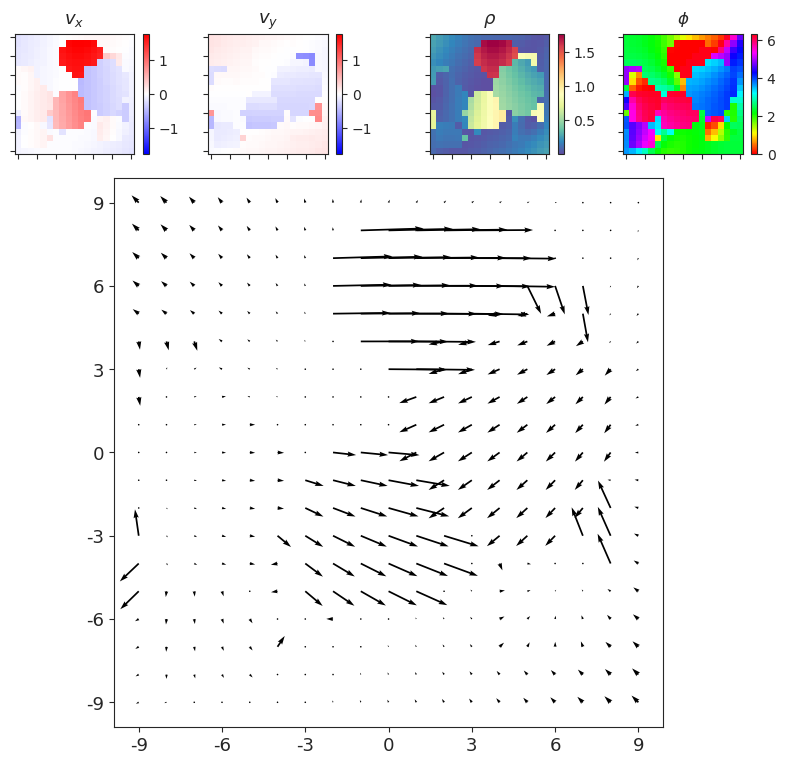

In [191]:
_ = show_opticflow_full(of.alpha_dot[accepted][8], scale=15)

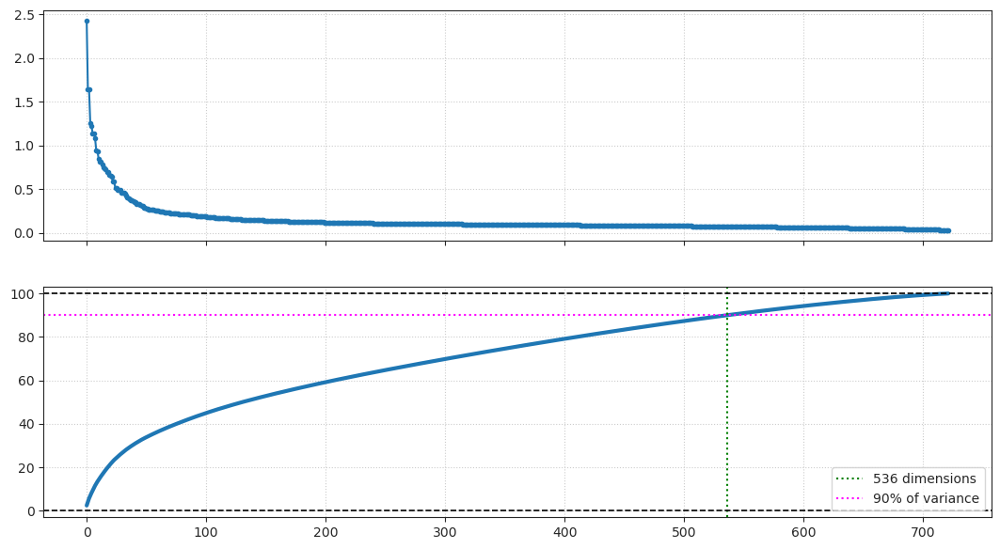

In [192]:
_plot_singular_values(s)

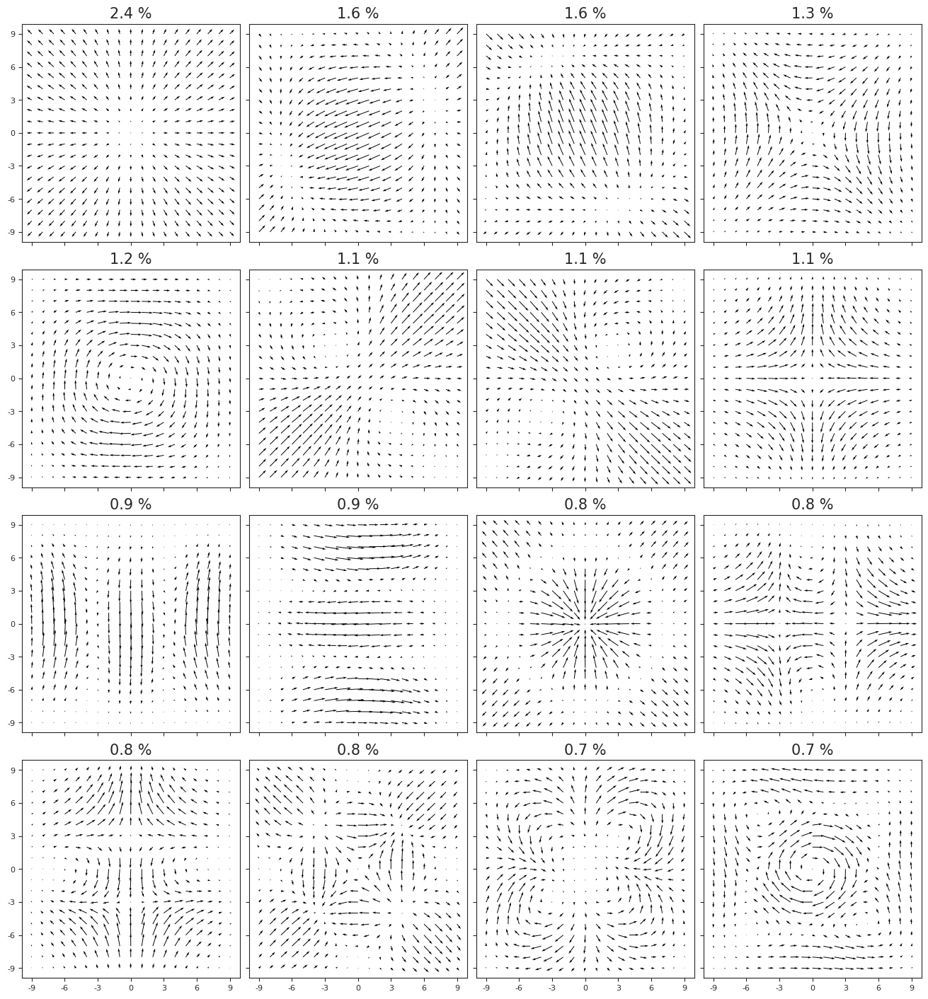

In [193]:
show_opticflow(pcs, num=4, titles=titles, scale=None, figsize=(13, 14));

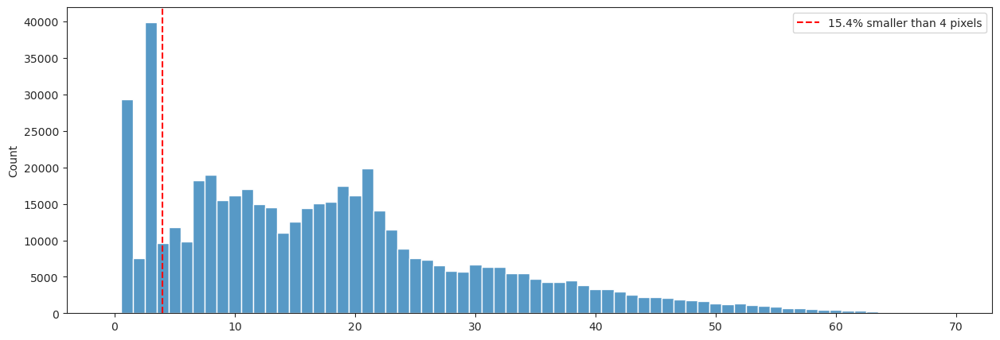

In [194]:
fig, ax = create_figure(1,1,(15, 5))
size_pix = of.objects[0].size * of.dim ** 2
sns.histplot(size_pix, bins=np.linspace(0, 70, 71) - 0.5, ax=ax)

thres = 4
lbl = f'{100 * (size_pix < thres).sum() / of.num:0.1f}% smaller than {thres} pixels'
ax.axvline(thres, color='r', ls='--', label=lbl)
ax.legend();

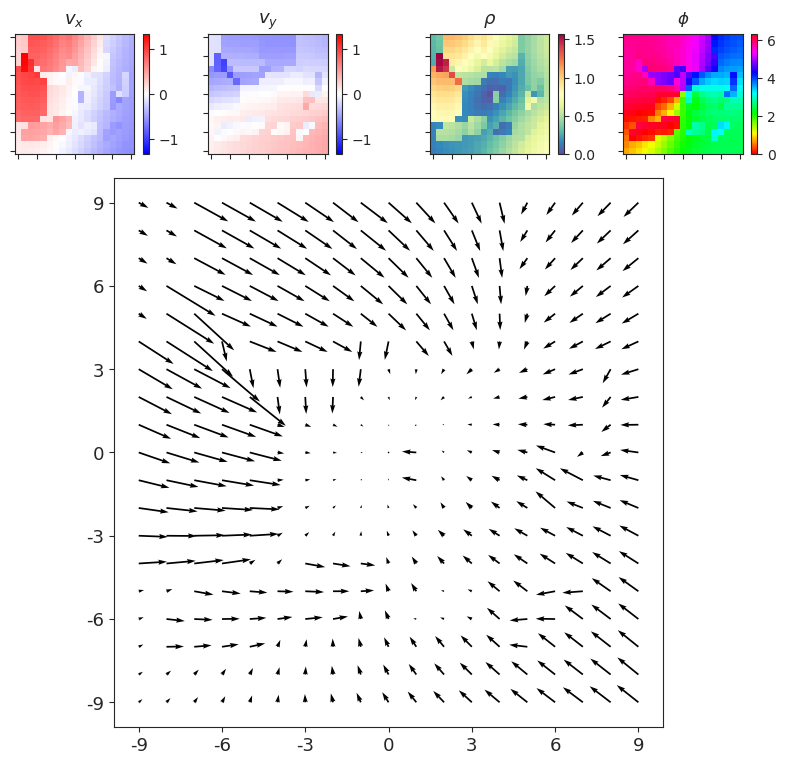

In [195]:
i = np.argmin(size_pix[accepted])
_ = show_opticflow_full(of.alpha_dot[accepted][i], scale=15)

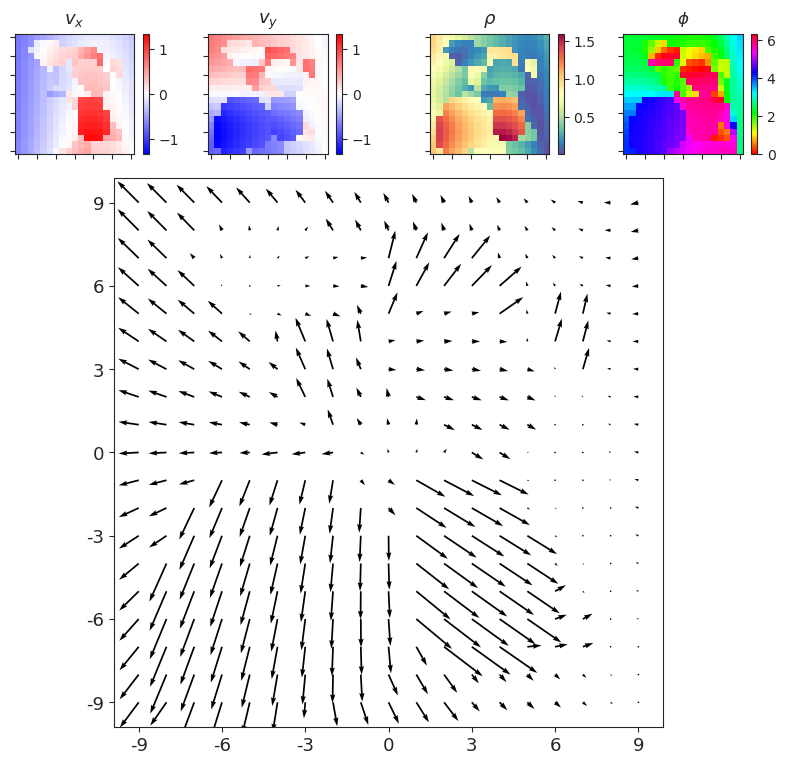

In [197]:
i = np.argmax(size_pix[accepted])
_ = show_opticflow_full(of.alpha_dot[accepted][i], scale=18)

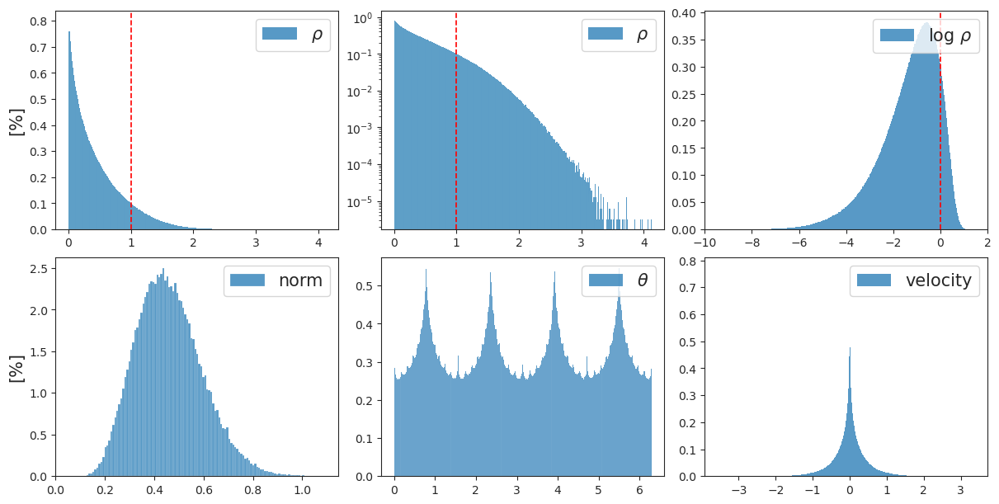

CPU times: user 1min 32s, sys: 10 s, total: 1min 42s
Wall time: 1min 42s


In [198]:
%%time

_ = plot_opticflow_hist(of.alpha_dot[accepted])

## 4. pursuit
**Meaning:** Self-motion while maintaining fixation on a moving object. Eyes rotate to compensate for the net motion of the object + self.

### num objects = 1

In [106]:
%%time

of = OpticFlow(
    category='pursuit',
    num=int(1.3e5),
    n_obj=1,
    **kws,
).compute_coords()
_ = of.compute_flow()
of.gamma = None

thres = 4
accepted = {
    i: obj.size * of.dim ** 2 > thres
    for i, obj in of.objects.items()
}
accepted = functools.reduce(
    np.logical_and,
    accepted.values(),
)

u, s, v = sp_lin.svd(
    a=flatten_arr(of.alpha_dot, ndim_end=0, ndim_start=1),
    full_matrices=False,
    compute_uv=True,
)
s *= 100 / s.sum()
titles = [f"{e:0.1f} %" for e in s]
pcs = v.reshape(-1, of.dim, of.dim, 2)

CPU times: user 2min 27s, sys: 34.2 s, total: 3min 1s
Wall time: 2min 6s


In [107]:
accepted.sum()

130000

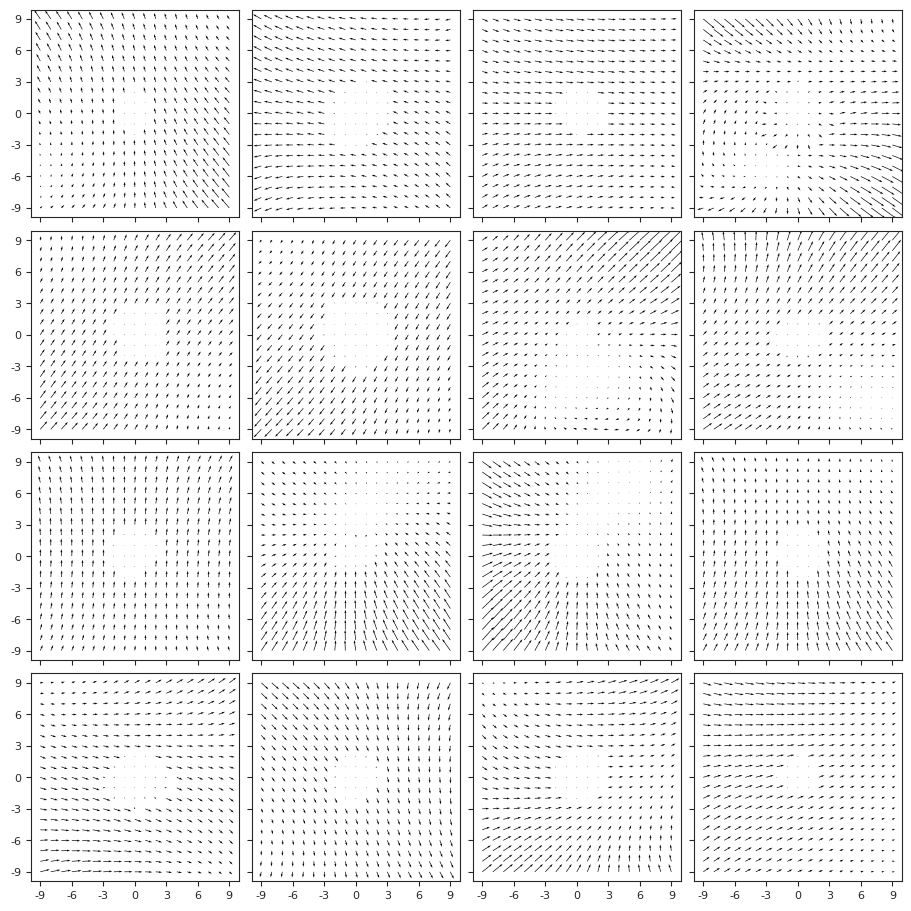

In [117]:
_ = show_opticflow(of.alpha_dot[accepted][200:], scale=None)

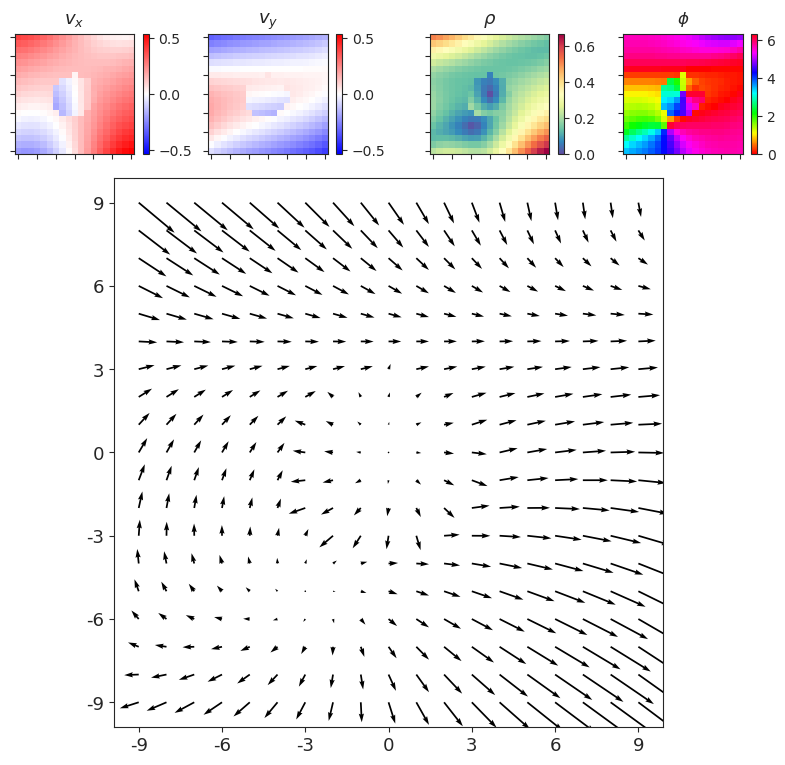

In [123]:
_ = show_opticflow_full(of.alpha_dot[accepted][203], scale=6)

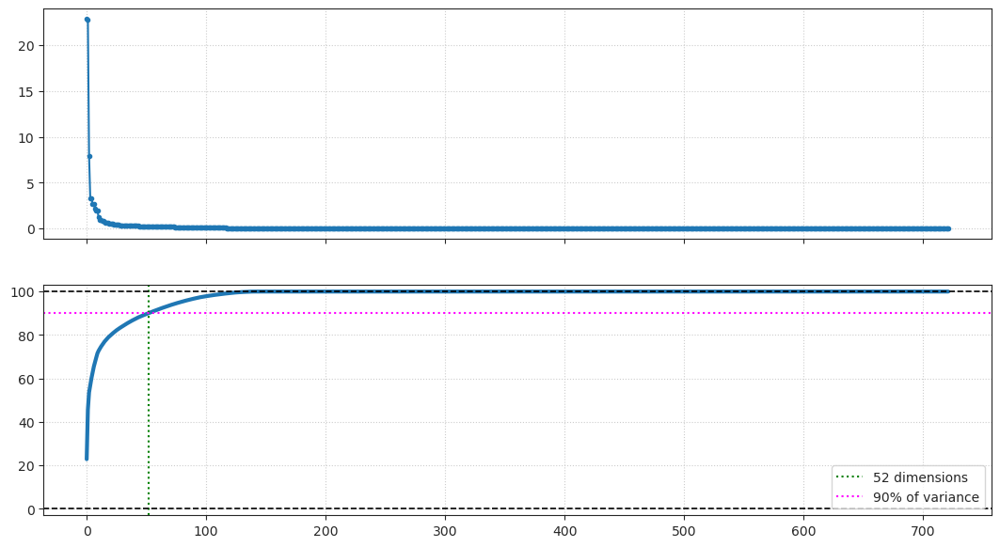

In [124]:
_plot_singular_values(s)

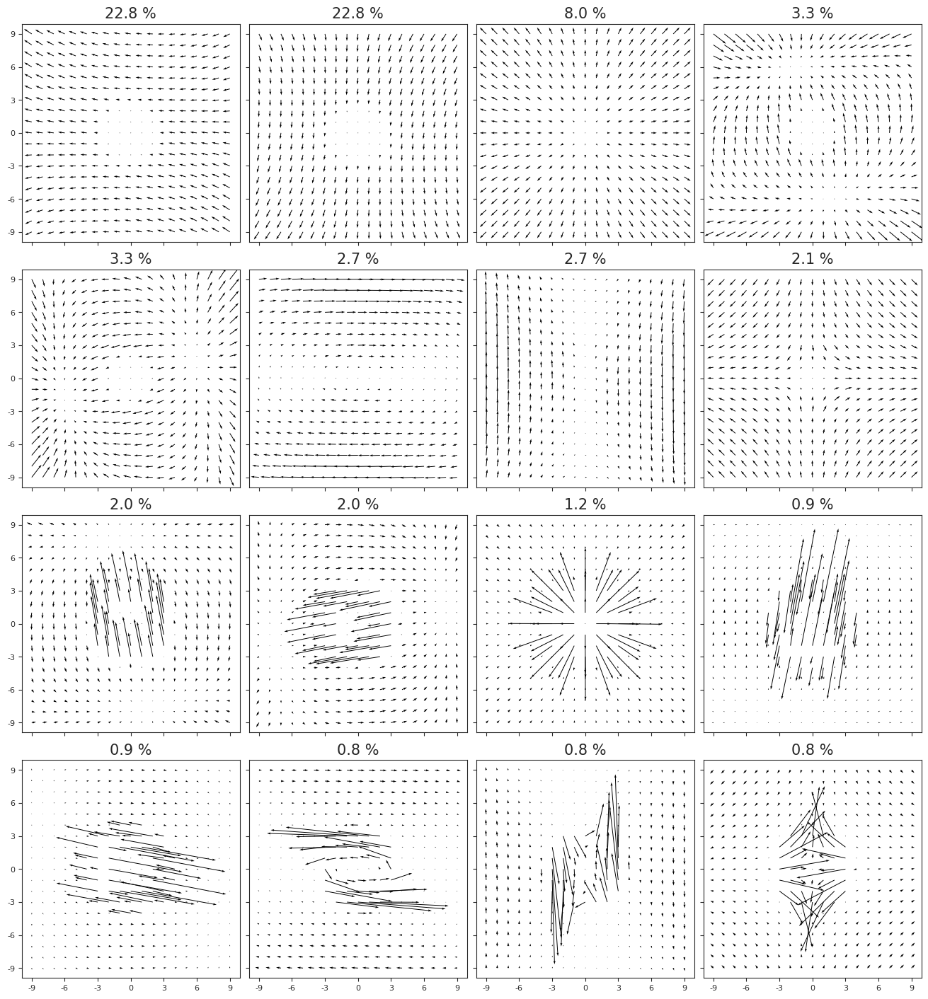

In [125]:
show_opticflow(pcs, num=4, titles=titles, scale=None, figsize=(13, 14));

In [128]:
size_pix = of.objects[0].size * of.dim ** 2

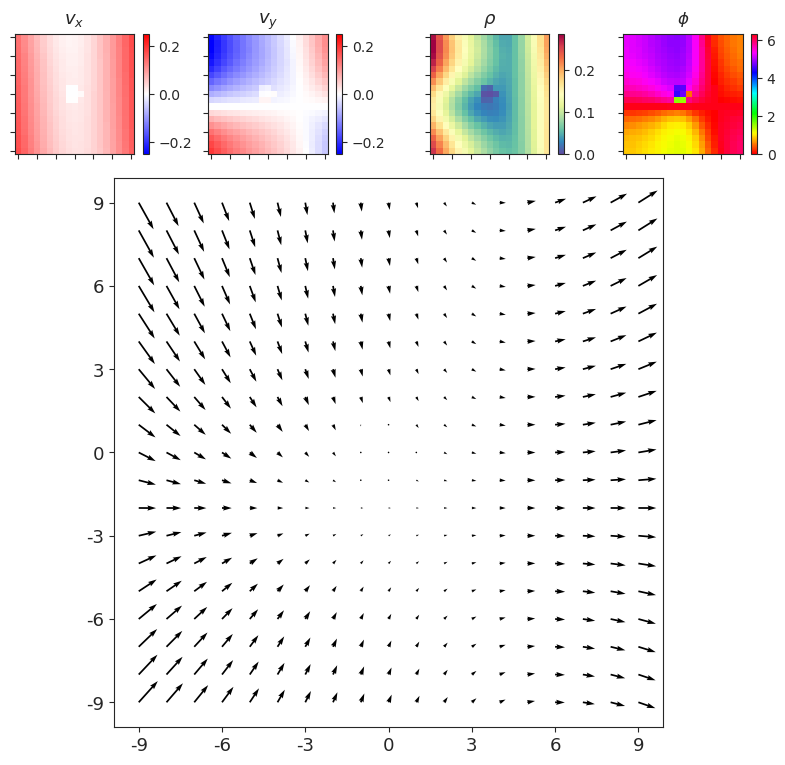

In [133]:
i = np.argmin(size_pix[accepted])
_ = show_opticflow_full(of.alpha_dot[accepted][i], scale=5)

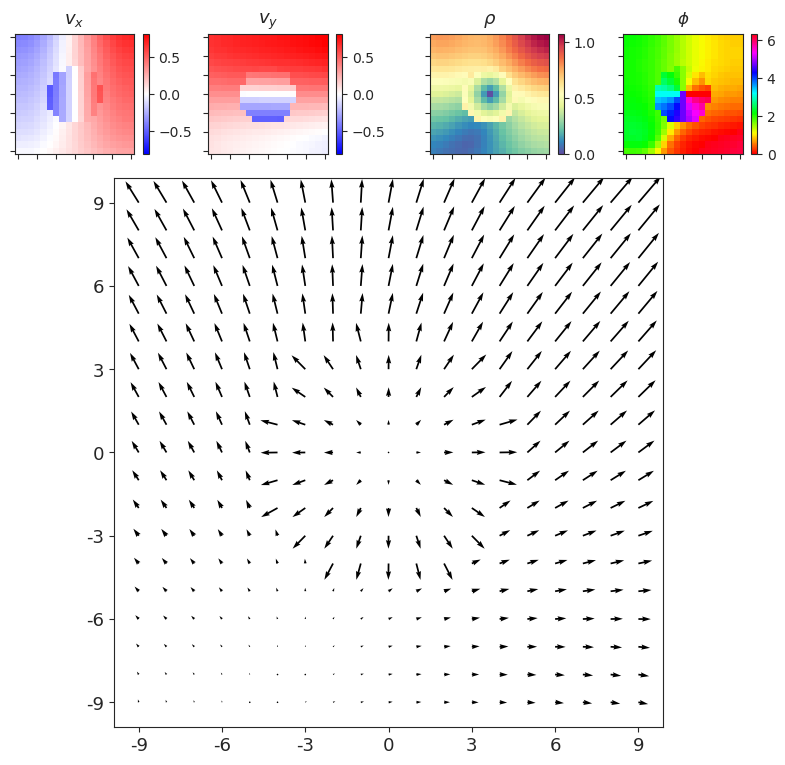

In [136]:
i = np.argmax(size_pix[accepted])
_ = show_opticflow_full(of.alpha_dot[accepted][i], scale=17)

### num objects = 2

In [137]:
%%time

of = OpticFlow(
    category='pursuit',
    num=int(1.3e5),
    n_obj=2,
    **kws,
).compute_coords()
_ = of.compute_flow()
of.gamma = None

thres = 4
accepted = {
    i: obj.size * of.dim ** 2 > thres
    for i, obj in of.objects.items()
}
accepted = functools.reduce(
    np.logical_and,
    accepted.values(),
)

u, s, v = sp_lin.svd(
    a=flatten_arr(of.alpha_dot, ndim_end=0, ndim_start=1),
    full_matrices=False,
    compute_uv=True,
)
s *= 100 / s.sum()
titles = [f"{e:0.1f} %" for e in s]
pcs = v.reshape(-1, of.dim, of.dim, 2)

CPU times: user 2min 52s, sys: 1min 6s, total: 3min 58s
Wall time: 2min 59s


In [140]:
accepted.sum()

107617

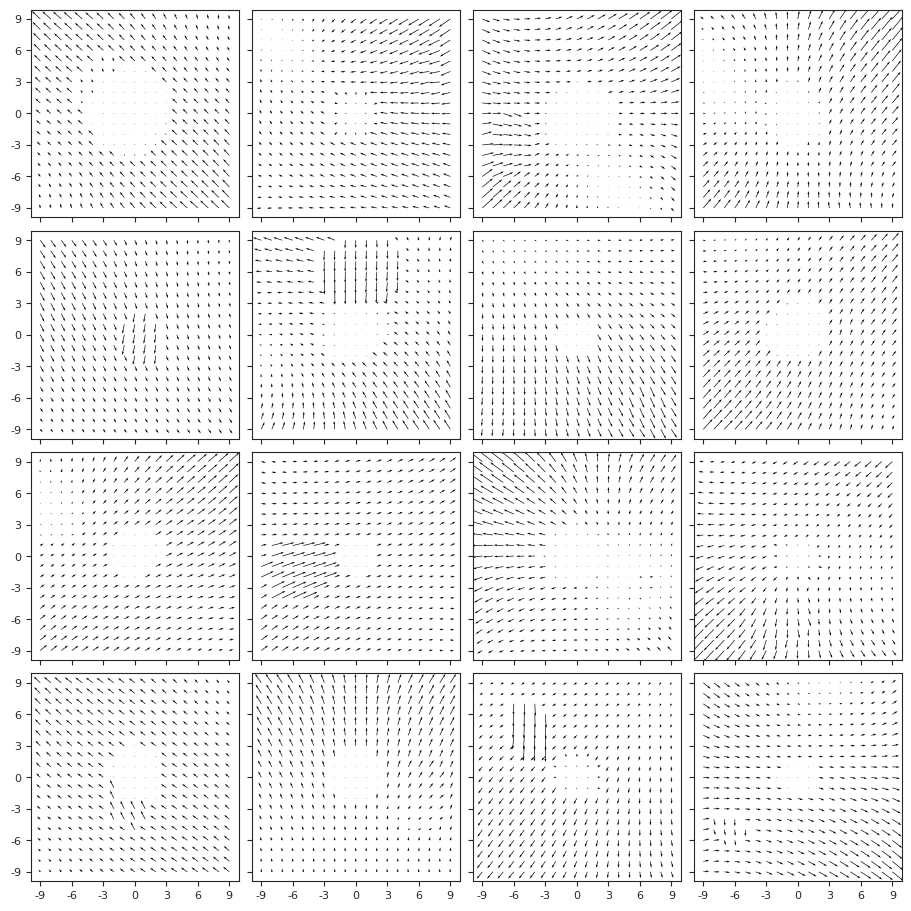

In [141]:
_ = show_opticflow(of.alpha_dot[accepted][200:], scale=None)

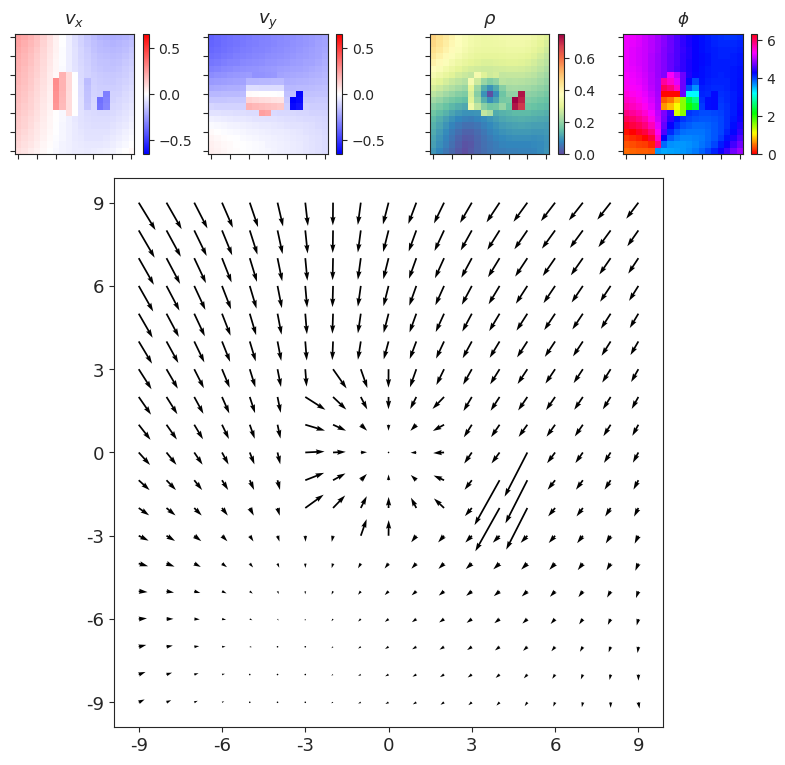

In [156]:
_ = show_opticflow_full(of.alpha_dot[accepted][1409], scale=8)

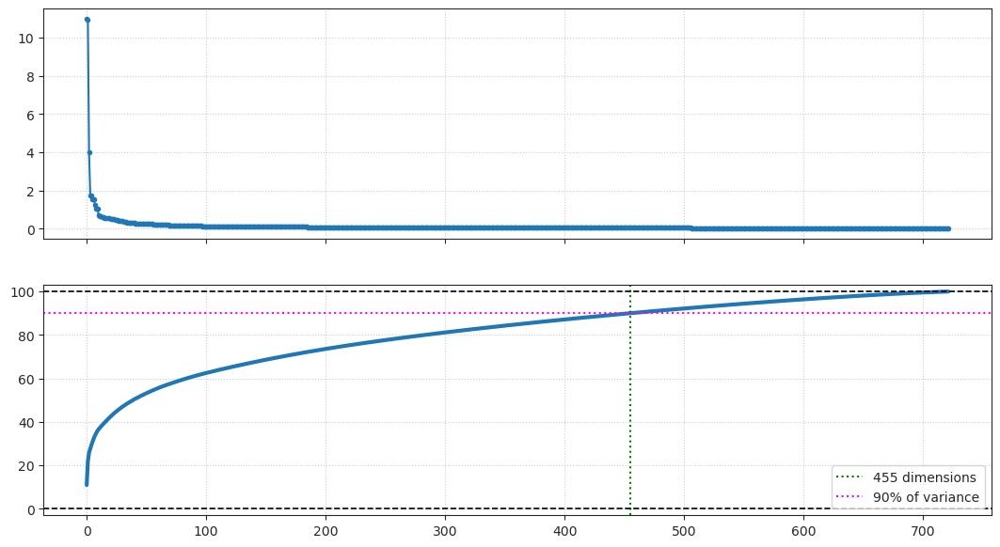

In [157]:
_plot_singular_values(s)

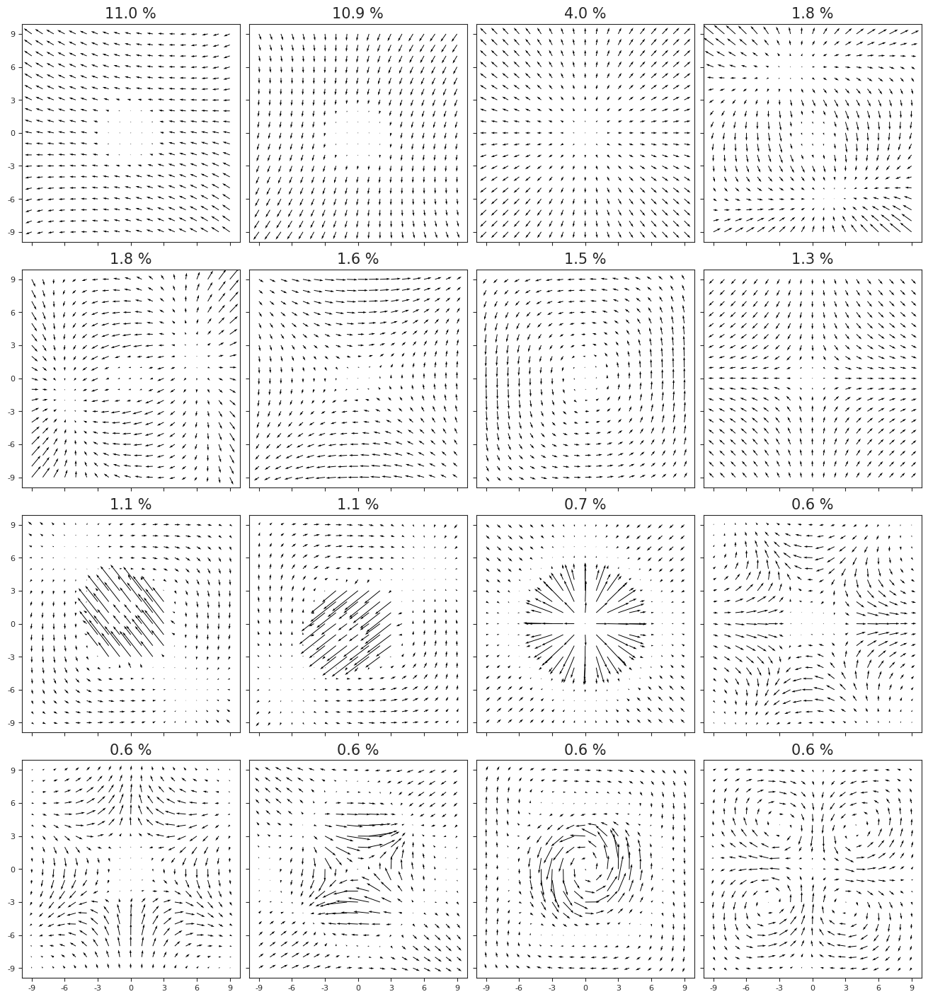

In [158]:
show_opticflow(pcs, num=4, titles=titles, scale=None, figsize=(13, 14));

In [159]:
size_pix = of.objects[0].size * of.dim ** 2

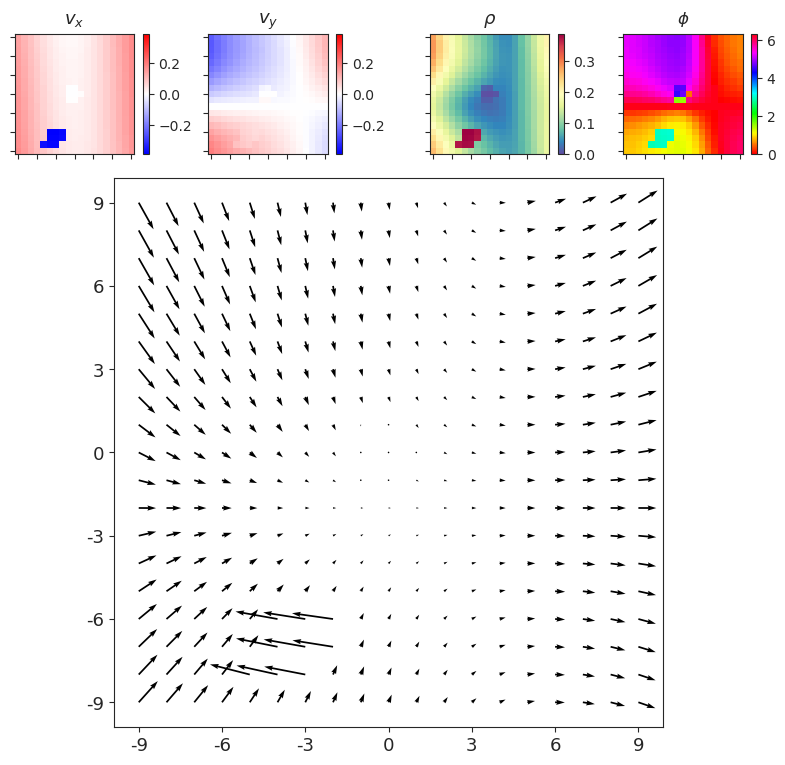

In [160]:
i = np.argmin(size_pix[accepted])
_ = show_opticflow_full(of.alpha_dot[accepted][i], scale=5)

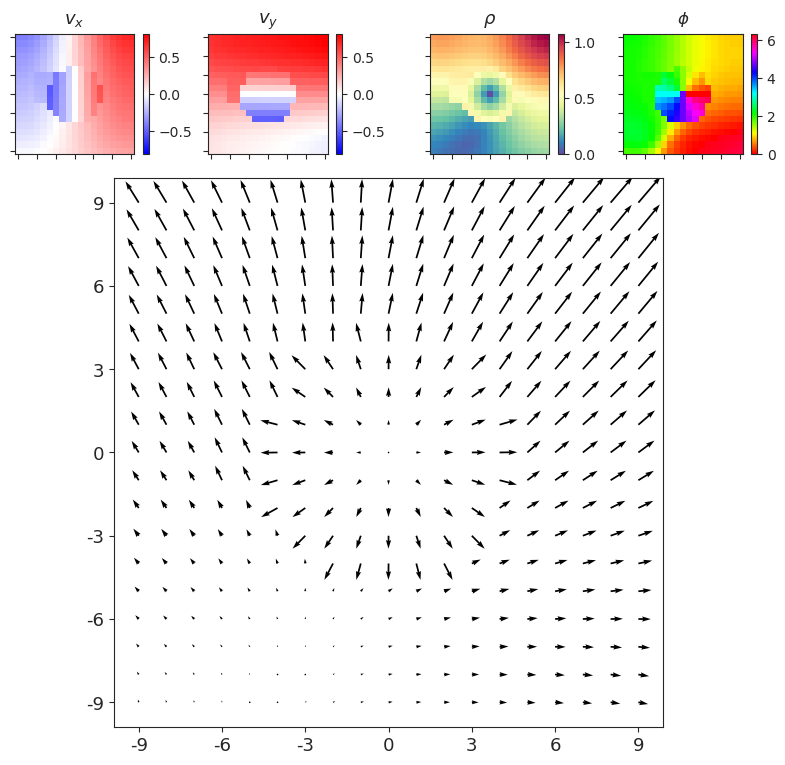

In [161]:
i = np.argmax(size_pix[accepted])
_ = show_opticflow_full(of.alpha_dot[accepted][i], scale=17)